In [2]:
import pandas as pd

file_path = "resultphyschem.csv"
data = pd.read_csv(file_path)

print(data.info())
print(data.head())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4213 entries, 0 to 4212
Data columns (total 81 columns):
 #   Column                                             Non-Null Count  Dtype  
---  ------                                             --------------  -----  
 0   OrganizationIdentifier                             4213 non-null   object 
 1   OrganizationFormalName                             4213 non-null   object 
 2   ActivityIdentifier                                 4213 non-null   object 
 3   ActivityTypeCode                                   4213 non-null   object 
 4   ActivityMediaName                                  4213 non-null   object 
 5   ActivityMediaSubdivisionName                       3974 non-null   object 
 6   ActivityStartDate                                  4213 non-null   object 
 7   ActivityStartTime/Time                             4213 non-null   object 
 8   ActivityStartTime/TimeZoneCode                     4213 non-null   object 
 9   Activity

In [3]:
# Filter for Lake Erie using approximate coordinates
lake_erie_data = data[
    (data['ActivityLocation/LatitudeMeasure'] > 41.0) & 
    (data['ActivityLocation/LatitudeMeasure'] < 42.5) & 
    (data['ActivityLocation/LongitudeMeasure'] > -83.5) & 
    (data['ActivityLocation/LongitudeMeasure'] < -79.5)
]

# Confirm filtering
print(lake_erie_data.shape)


(2171, 81)


In [4]:
# Select columns of interest
columns_of_interest = [
    'ActivityStartDate', 'ActivityLocation/LatitudeMeasure', 
    'ActivityLocation/LongitudeMeasure', 'CharacteristicName', 
    'ResultMeasureValue', 'ResultMeasure/MeasureUnitCode'
]
lake_erie_data = lake_erie_data[columns_of_interest]

# Check for missing values
print(lake_erie_data.isnull().sum())


ActivityStartDate                     0
ActivityLocation/LatitudeMeasure      0
ActivityLocation/LongitudeMeasure     0
CharacteristicName                    0
ResultMeasureValue                   35
ResultMeasure/MeasureUnitCode        35
dtype: int64


In [12]:
# Fill missing MeasureUnitCode based on most common unit for each CharacteristicName
most_common_units = lake_erie_data.groupby('CharacteristicName')[
    'ResultMeasure/MeasureUnitCode'
].agg(lambda x: x.mode()[0] if not x.mode().empty else None)

lake_erie_data['ResultMeasure/MeasureUnitCode'] = lake_erie_data.apply(
    lambda row: most_common_units[row['CharacteristicName']]
    if pd.isnull(row['ResultMeasure/MeasureUnitCode']) else row['ResultMeasure/MeasureUnitCode'], axis=1
)


In [14]:
print(cleaned_nutrient.isnull().sum())


NameError: name 'cleaned_nutrient' is not defined

In [7]:
lake_erie_data_cleaned.to_csv("cleaned_nutrient.csv", index=False)

NameError: name 'lake_erie_data_cleaned' is not defined

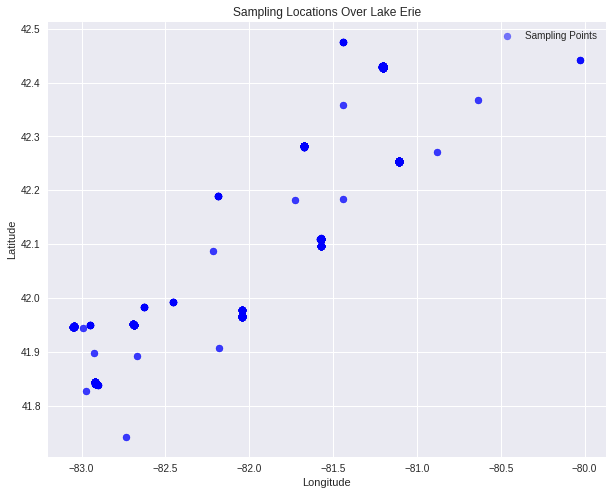

In [8]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 8))
plt.scatter(
    lake_erie_data['ActivityLocation/LongitudeMeasure'],
    lake_erie_data['ActivityLocation/LatitudeMeasure'],
    c='blue', alpha=0.5, label='Sampling Points'
)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Sampling Locations Over Lake Erie')
plt.legend()
plt.show()

In [9]:
# Set the CRS using older method
sampling_points.crs = {'init': 'epsg:4326'}  # WGS84

NameError: name 'sampling_points' is not defined

In [10]:
pip install --upgrade geopandas


Requirement already up-to-date: geopandas in /opt/conda/lib/python3.7/site-packages (0.10.2)
Note: you may need to restart the kernel to use updated packages.


In [11]:
print(type(sampling_points))  # Should return <class 'geopandas.geodataframe.GeoDataFrame'>
print(sampling_points.head())  # Preview data


NameError: name 'sampling_points' is not defined

In [ ]:
print(sampling_points.geometry.head())


In [ ]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point

# Load your dataset
df = pd.read_csv("cleaned_nutrient.csv")

# Ensure columns exist for latitude and longitude
geometry = [Point(xy) for xy in zip(df['ActivityLocation/LongitudeMeasure'], df['ActivityLocation/LatitudeMeasure'])]
sampling_points = gpd.GeoDataFrame(df, geometry=geometry)

# Set the CRS (handle older versions of geopandas)
try:
    sampling_points.set_crs(epsg=4326, inplace=True)  # For newer versions
except AttributeError:
    sampling_points.crs = {'init': 'epsg:4326'}  # For older versions

print(sampling_points.head())  # Verify the GeoDataFrame


In [ ]:
# Load the GeoJSON file for Lake Erie boundaries
lake_erie = gpd.read_file("lake-erie_812.geojson")

# Ensure CRS matches your sampling points
lake_erie = lake_erie.to_crs(sampling_points.crs)

# Plot the lake boundaries
ax = lake_erie.plot(color="lightblue", edgecolor="black", figsize=(10, 8))
sampling_points.plot(ax=ax, color="blue", markersize=10, label="Sampling Points")
ax.legend(loc="upper right")
ax.set_title("Sampling Points Over Lake Erie")
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Extract coordinates and nutrient values
lons = sampling_points.geometry.x
lats = sampling_points.geometry.y
values = sampling_points['ResultMeasureValue']  # Replace with actual nutrient column

# Create an interpolated contour map
fig, ax = plt.subplots(figsize=(10, 8))
lake_erie.plot(ax=ax, color="lightblue", edgecolor="black")  # Plot the lake

# Plot nutrient data as contours
contour = ax.tricontourf(lons, lats, values, levels=15, cmap="viridis", alpha=0.7)
plt.colorbar(contour, ax=ax, label="Nutrient Level (µg/L)")

# Add sampling points on top
ax.scatter(lons, lats, color="red", edgecolor="black", label="Sampling Points")
ax.legend(loc="upper right")
ax.set_title("Nutrient Levels Over Lake Erie")
plt.show()


In [ ]:
filtered_points = sampling_points[
    (sampling_points["ActivityStartDate"] >= "2018-01-01") &
    (sampling_points["ActivityStartDate"] <= "2019-12-31") &
    (sampling_points["CharacteristicName"] == "Total Phosphorus")
]

In [ ]:
from scipy.interpolate import griddata
import numpy as np

# Create a grid for interpolation
xi = np.linspace(lons.min(), lons.max(), 100)
yi = np.linspace(lats.min(), lats.max(), 100)
xi, yi = np.meshgrid(xi, yi)

# Interpolate the values onto the grid
zi = griddata((lons, lats), values, (xi, yi), method='cubic')

# Plot interpolated data
contour = ax.contourf(xi, yi, zi, levels=15, cmap='viridis', alpha=0.7)
plt.colorbar(contour, ax=ax, label="Nutrient Level (µg/L)")


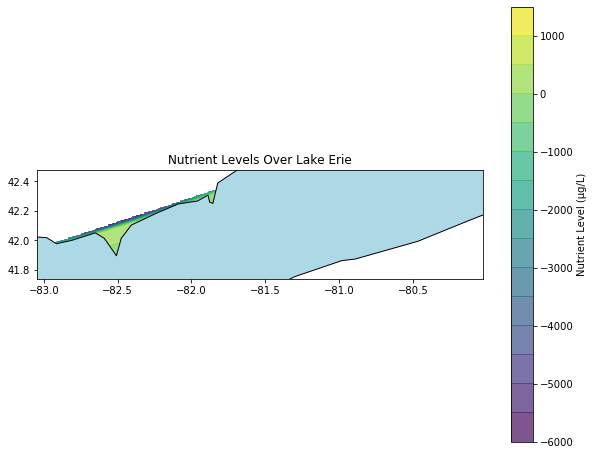

In [99]:
from scipy.interpolate import griddata
import numpy as np
import matplotlib.pyplot as plt

# Define figure and axis
fig, ax = plt.subplots(figsize=(10, 8))

# Create a grid for interpolation
xi = np.linspace(lons.min(), lons.max(), 100)
yi = np.linspace(lats.min(), lats.max(), 100)
xi, yi = np.meshgrid(xi, yi)

# Interpolate the values onto the grid
zi = griddata((lons, lats), values, (xi, yi), method='cubic')

# Plot the interpolated data
contour = ax.contourf(xi, yi, zi, levels=15, cmap='viridis', alpha=0.7)
plt.colorbar(contour, ax=ax, label="Nutrient Level (µg/L)")

# Optional: Overlay lake boundary
lake_erie.plot(ax=ax, color="lightblue", edgecolor="black")

# Plot adjustments
ax.set_xlim(lons.min(), lons.max())
ax.set_ylim(lats.min(), lats.max())
ax.set_title("Nutrient Levels Over Lake Erie")
plt.show()


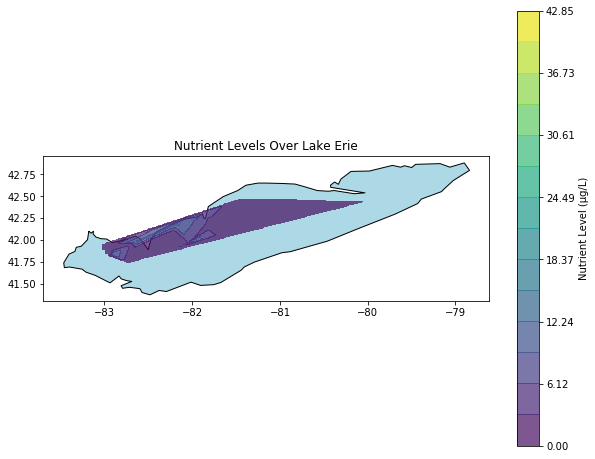

In [100]:
# Filter out invalid or negative nutrient values
mask = values > 0  # Retain only positive values
lons = lons[mask]
lats = lats[mask]
values = values[mask]

# Create a grid for interpolation
xi = np.linspace(lons.min(), lons.max(), 100)
yi = np.linspace(lats.min(), lats.max(), 100)
xi, yi = np.meshgrid(xi, yi)

# Interpolate the values
zi = griddata((lons, lats), values, (xi, yi), method='linear')  # Switch to 'linear' if needed

# Plot the interpolated data
fig, ax = plt.subplots(figsize=(10, 8))
lake_erie.plot(ax=ax, color="lightblue", edgecolor="black")
contour = ax.contourf(xi, yi, zi, levels=np.linspace(0, values.max(), 15), cmap='viridis', alpha=0.7)
cbar = plt.colorbar(contour, ax=ax, label="Nutrient Level (µg/L)")
ax.set_title("Nutrient Levels Over Lake Erie")
plt.show()


In [101]:
xi = np.linspace(lons.min(), lons.max(), 200)  # Increase from 100 to 200
yi = np.linspace(lats.min(), lats.max(), 200)


In [102]:
max_index = values.idxmax()
ax.scatter(lons[max_index], lats[max_index], color="red", label="Max Value", zorder=5)
ax.legend(loc="upper right")


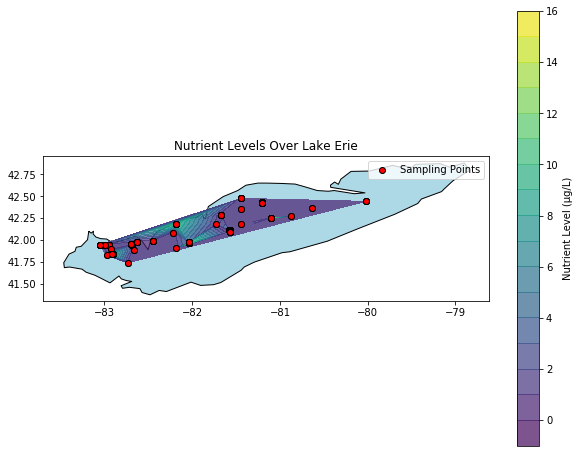

In [109]:
import matplotlib.pyplot as plt
import numpy as np

# Extract coordinates and nutrient values
lons = sampling_points.geometry.x
lats = sampling_points.geometry.y
values = sampling_points['ResultMeasureValue']  # Replace with actual nutrient column

# Create an interpolated contour map
fig, ax = plt.subplots(figsize=(10, 8))
lake_erie.plot(ax=ax, color="lightblue", edgecolor="black")  # Plot the lake

# Plot nutrient data as contours
contour = ax.tricontourf(lons, lats, values, levels=15, cmap="viridis", alpha=0.7)
plt.colorbar(contour, ax=ax, label="Nutrient Level (µg/L)")

# Add sampling points on top
ax.scatter(lons, lats, color="red", edgecolor="black", label="Sampling Points")
ax.legend(loc="upper right")
ax.set_title("Nutrient Levels Over Lake Erie")
plt.show()

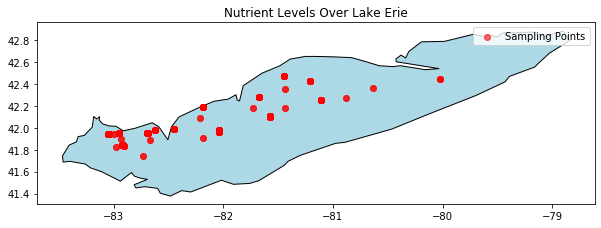

In [110]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Create a scatter plot for points
fig, ax = plt.subplots(figsize=(10, 8))
lake_erie.plot(ax=ax, color='lightblue', edgecolor='black')
sampling_points.plot(
    ax=ax, marker='o', color='red', alpha=0.6, label='Sampling Points'
)
ax.set_title("Nutrient Levels Over Lake Erie")
ax.legend()
plt.show()


In [17]:
import pandas as pd
import numpy as np

# Read the CSV file
df = pd.read_csv('resultphyschem.csv')

# Convert ActivityStartDate to datetime
df['ActivityStartDate'] = pd.to_datetime(df['ActivityStartDate'])

# Filter for Lake Erie data (assuming all data in the file is from Lake Erie)
# If not, you'll need to add a filter based on location information

# Filter for date range 2009 to 2023
df = df[(df['ActivityStartDate'].dt.year >= 2009) & (df['ActivityStartDate'].dt.year <= 2023)]

# Create a season column
df['Season'] = df['ActivityStartDate'].dt.month.map({1: 'Winter', 2: 'Winter', 3: 'Spring',
                                                     4: 'Spring', 5: 'Spring', 6: 'Summer',
                                                     7: 'Summer', 8: 'Summer', 9: 'Fall',
                                                     10: 'Fall', 11: 'Fall', 12: 'Winter'})

# Create a Year column
df['Year'] = df['ActivityStartDate'].dt.year

# Filter for relevant nutrients (adjust as needed)
nutrients = ['Orthophosphate', 'Total Phosphorus, mixed forms']
df = df[df['CharacteristicName'].isin(nutrients)]

# Ensure ResultMeasureValue is numeric
df['ResultMeasureValue'] = pd.to_numeric(df['ResultMeasureValue'], errors='coerce')

# Group by Year, Season, and CharacteristicName, then calculate statistics
grouped = df.groupby(['Year', 'Season', 'CharacteristicName']).agg({
    'ResultMeasureValue': ['count', 'mean', 'median', 'min', 'max', 'std']
}).reset_index()

# Flatten column names
grouped.columns = ['Year', 'Season', 'CharacteristicName', 'Count', 'Mean', 'Median', 'Min', 'Max', 'Std']

# Sort the results
grouped = grouped.sort_values(['Year', 'Season', 'CharacteristicName'])

# Display the results
print(grouped)

# Optionally, save to CSV
grouped.to_csv('lake_erie_nutrients_by_season_2009_2023.csv', index=False)

    Year  Season             CharacteristicName  Count       Mean     Median  \
0   2009  Spring                 Orthophosphate     55   1.609605   0.909236   
1   2009  Spring  Total Phosphorus, mixed forms      2  23.215387  23.215387   
2   2009  Summer                 Orthophosphate     58   0.799099   0.646422   
3   2009  Summer  Total Phosphorus, mixed forms      5   5.539696   3.760800   
4   2010  Spring                 Orthophosphate     58   2.355155   1.473500   
5   2010  Spring  Total Phosphorus, mixed forms      3   6.769187   9.122400   
6   2010  Summer                 Orthophosphate     63   0.976968   0.783000   
7   2010  Summer  Total Phosphorus, mixed forms      4   5.529980   3.121980   
8   2011  Spring                 Orthophosphate     53   2.293491   1.817000   
9   2011  Spring  Total Phosphorus, mixed forms      2   8.646600   8.646600   
10  2011  Summer                 Orthophosphate     62   0.754323   0.538000   
11  2011  Summer  Total Phosphorus, mixe

In [115]:
pip install --upgrade pandas matplotlib seaborn

Requirement already up-to-date: pandas in /opt/conda/lib/python3.7/site-packages (1.3.5)
     |████████████████████████████████| 11.2MB 37.4MB/s 
     |████████████████████████████████| 296kB 64.7MB/s 
  Using cached https://files.pythonhosted.org/packages/49/df/1fceb2f8900f8639e278b056416d49134fb8d84c5942ffaa01ad34782422/packaging-24.0-py3-none-any.whl
     |████████████████████████████████| 972kB 70.8MB/s 
     |████████████████████████████████| 50.5MB 73.0MB/s 
  Using cached https://files.pythonhosted.org/packages/ec/6b/63cc3df74987c36fe26157ee12e09e8f9db4de771e0f3404263117e75b95/typing_extensions-4.7.1-py3-none-any.whl
  Created wheel for pillow: filename=Pillow-9.5.0-cp37-cp37m-linux_x86_64.whl size=1441037 sha256=ab3b39ae0773c34acd3d73d72243fd1ff55fc434680035dd4e506ef7a9ef13a1
  Stored in directory: /home/jovyan/.cache/pip/wheels/ca/4d/df/d168a9bc75cabf441026762d25f8a03a3cce26d81101a94590
Successfully built pillow
  Found existing installation: packaging 19.0
    Uninstalling pa

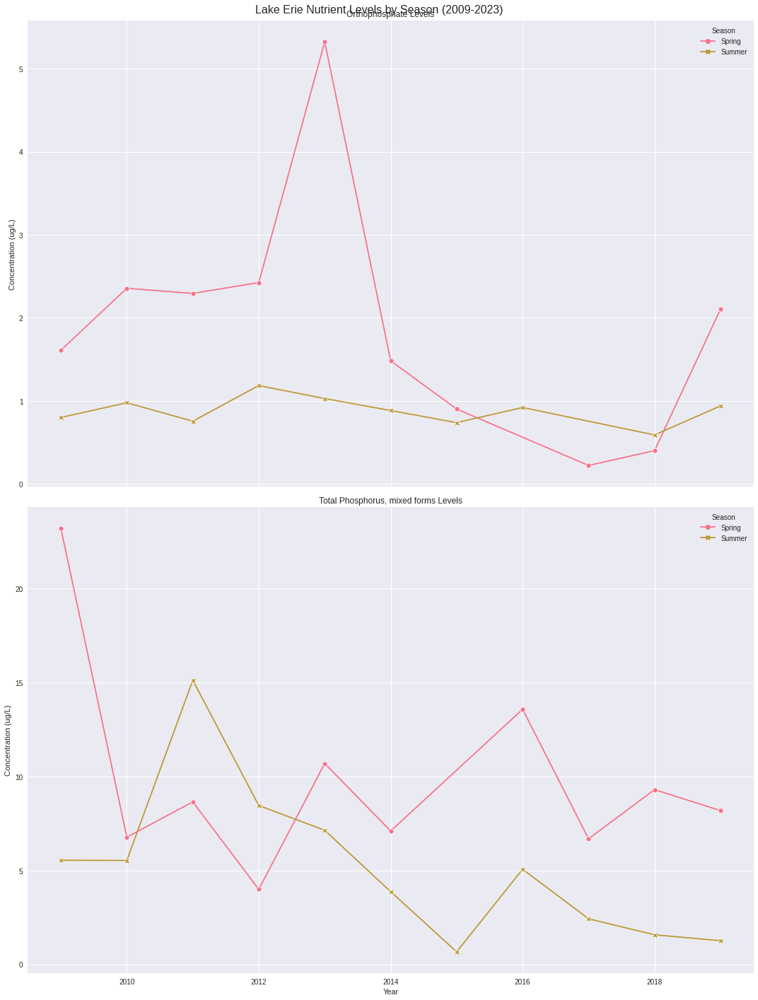

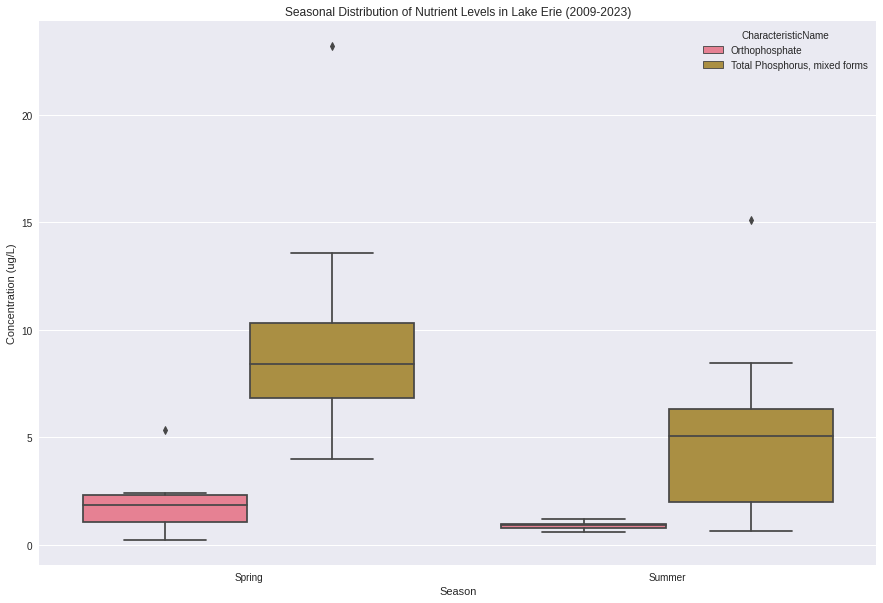

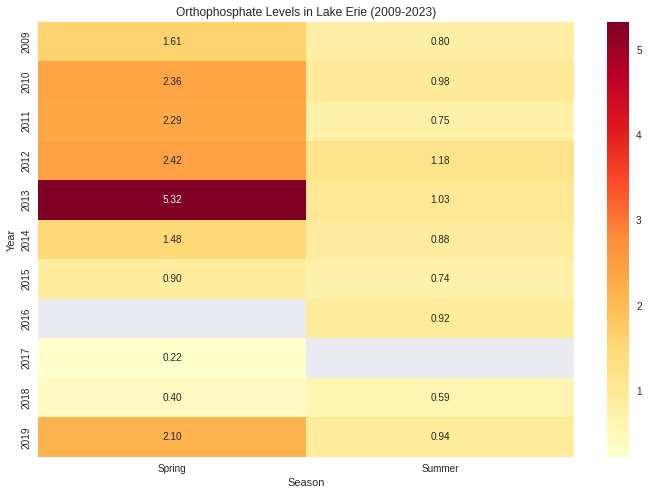

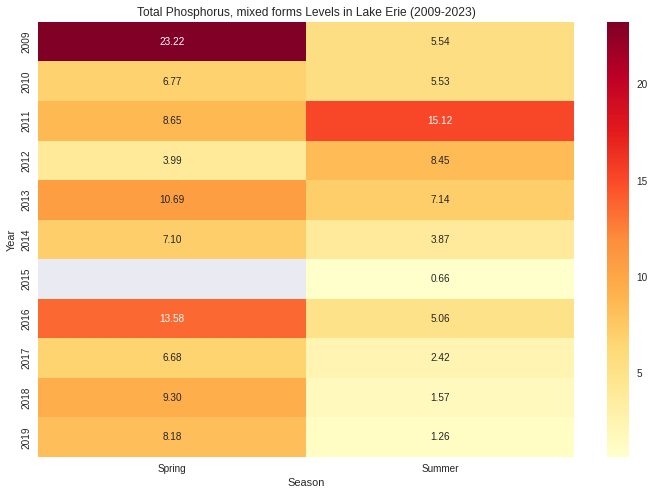

In [18]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime

# Read the CSV file
df = pd.read_csv('resultphyschem.csv')

# Convert ActivityStartDate to datetime
df['ActivityStartDate'] = pd.to_datetime(df['ActivityStartDate'])

# Filter for date range 2009 to 2023
df = df[(df['ActivityStartDate'].dt.year >= 2009) & (df['ActivityStartDate'].dt.year <= 2023)]

# Create a season column
def get_season(date):
    month = date.month
    if month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    elif month in [9, 10, 11]:
        return 'Fall'
    else:
        return 'Winter'

df['Season'] = df['ActivityStartDate'].dt.month.map({1: 'Winter', 2: 'Winter', 3: 'Spring',
                                                     4: 'Spring', 5: 'Spring', 6: 'Summer',
                                                     7: 'Summer', 8: 'Summer', 9: 'Fall',
                                                     10: 'Fall', 11: 'Fall', 12: 'Winter'})

# Create a Year column
df['Year'] = df['ActivityStartDate'].dt.year

# Filter for relevant nutrients (adjust as needed)
nutrients = ['Orthophosphate', 'Total Phosphorus, mixed forms']
df = df[df['CharacteristicName'].isin(nutrients)]

# Ensure ResultMeasureValue is numeric
df['ResultMeasureValue'] = pd.to_numeric(df['ResultMeasureValue'], errors='coerce')

# Group by Year, Season, and CharacteristicName, then calculate statistics
grouped = df.groupby(['Year', 'Season', 'CharacteristicName']).agg({
    'ResultMeasureValue': ['count', 'mean', 'median', 'min', 'max', 'std']
}).reset_index()

# Flatten column names
grouped.columns = ['Year', 'Season', 'CharacteristicName', 'Count', 'Mean', 'Median', 'Min', 'Max', 'Std']

# Sort the results
grouped = grouped.sort_values(['Year', 'Season', 'CharacteristicName'])

# Now we can start the visualization
plt.style.use('seaborn')
sns.set_palette("husl")

# Get unique nutrients
nutrients = grouped['CharacteristicName'].unique()

# Create a figure for line plots
fig, axes = plt.subplots(len(nutrients), 1, figsize=(15, 10*len(nutrients)), sharex=True)
fig.suptitle('Lake Erie Nutrient Levels by Season (2009-2023)', fontsize=16)

for i, nutrient in enumerate(nutrients):
    nutrient_data = grouped[grouped['CharacteristicName'] == nutrient]
    
    # Create a pivot table for easier plotting
    pivot_data = nutrient_data.pivot(index='Year', columns='Season', values='Mean')
    
    # Plot the data using Seaborn
    sns.lineplot(data=pivot_data, dashes=False, markers=True, ax=axes[i] if len(nutrients) > 1 else axes)
    
    axes[i].set_title(f'{nutrient} Levels') if len(nutrients) > 1 else axes.set_title(f'{nutrient} Levels')
    axes[i].set_xlabel('Year') if len(nutrients) > 1 else axes.set_xlabel('Year')
    axes[i].set_ylabel('Concentration (ug/L)') if len(nutrients) > 1 else axes.set_ylabel('Concentration (ug/L)')
    axes[i].legend(title='Season') if len(nutrients) > 1 else axes.legend(title='Season')
    axes[i].grid(True) if len(nutrients) > 1 else axes.grid(True)

plt.tight_layout()
plt.show()

# Box plot for seasonal distribution
plt.figure(figsize=(15, 10))
sns.boxplot(x='Season', y='Mean', hue='CharacteristicName', data=grouped)
plt.title('Seasonal Distribution of Nutrient Levels in Lake Erie (2009-2023)')
plt.ylabel('Concentration (ug/L)')
plt.show()

# Heatmap of nutrient levels over years
for nutrient in nutrients:
    nutrient_data = grouped[grouped['CharacteristicName'] == nutrient]
    pivot_data = nutrient_data.pivot(index='Year', columns='Season', values='Mean')
    
    plt.figure(figsize=(12, 8))
    sns.heatmap(pivot_data, annot=True, fmt='.2f', cmap='YlOrRd')
    plt.title(f'{nutrient} Levels in Lake Erie (2009-2023)')
    plt.show()


UnidentifiedImageError: cannot identify image file <_io.BytesIO object at 0x7f3aa8d37048>

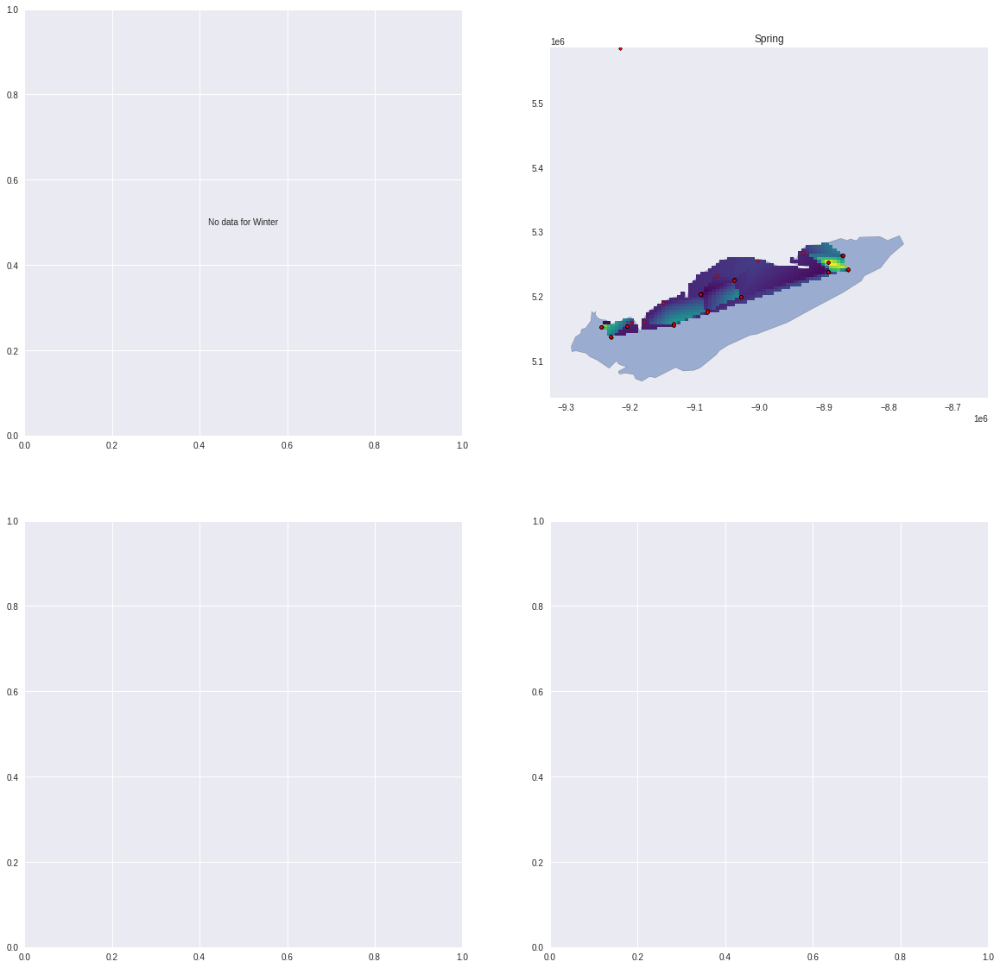

In [22]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import griddata
from shapely.geometry import Point
import contextily as ctx

# Load and preprocess the data
df = pd.read_csv('resultphyschem.csv')
df['ActivityStartDate'] = pd.to_datetime(df['ActivityStartDate'])
df['Season'] = pd.cut(df['ActivityStartDate'].dt.month, 
                      bins=[0, 3, 6, 9, 12], 
                      labels=['Winter', 'Spring', 'Summer', 'Fall'])

# Filter for orthophosphate data
df = df[df['CharacteristicName'] == 'Orthophosphate']
df['ResultMeasureValue'] = pd.to_numeric(df['ResultMeasureValue'], errors='coerce')

# Create GeoDataFrame
gdf = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(df['ActivityLocation/LongitudeMeasure'], df['ActivityLocation/LatitudeMeasure']),
    crs="EPSG:4326"
)

# Load Lake Erie GeoJSON
lake_erie = gpd.read_file('lake-erie_812.geojson')

# Ensure both datasets are in the same CRS
lake_erie = lake_erie.to_crs(epsg=3857)
gdf = gdf.to_crs(epsg=3857)

# Create a function to plot for each season
def plot_season(season, ax):
    season_data = gdf[gdf['Season'] == season]
    
    if len(season_data) == 0:
        ax.text(0.5, 0.5, f"No data for {season}", ha='center', va='center', transform=ax.transAxes)
        return None
    
    # Create a grid for interpolation
    x = np.linspace(gdf.geometry.x.min(), gdf.geometry.x.max(), 100)
    y = np.linspace(gdf.geometry.y.min(), gdf.geometry.y.max(), 100)
    xi, yi = np.meshgrid(x, y)
    
    # Interpolate the data
    zi = griddata((season_data.geometry.x, season_data.geometry.y), 
                  season_data['ResultMeasureValue'], 
                  (xi, yi), 
                  method='linear')
    
    # Mask out areas outside Lake Erie
    lake_mask = lake_erie.geometry.unary_union
    mask = gpd.GeoDataFrame(geometry=[Point(xi, yi) for xi, yi in zip(xi.flatten(), yi.flatten())], crs=lake_erie.crs).within(lake_mask)
    mask = mask.values.reshape(xi.shape)
    zi = np.ma.masked_where(~mask, zi)
    
    # Plot
    lake_erie.plot(ax=ax, alpha=0.5, edgecolor='black')
    im = ax.pcolormesh(xi, yi, zi, cmap='viridis', shading='auto')
    ax.scatter(season_data.geometry.x, season_data.geometry.y, c='red', s=10, edgecolor='black')
    ax.set_title(f"{season}")
    ctx.add_basemap(ax, crs=lake_erie.crs.to_string(), source=ctx.providers.Stamen.TerrainBackground)
    return im

# Create the plot
fig, axs = plt.subplots(2, 2, figsize=(20, 20))
axs = axs.ravel()

images = []
for i, season in enumerate(['Winter', 'Spring', 'Summer', 'Fall']):
    im = plot_season(season, axs[i])
    if im is not None:
        images.append(im)

# Add a colorbar if we have at least one plot
if images:
    cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
    fig.colorbar(images[0], cax=cbar_ax, label='Orthophosphate (ug/L)')

plt.suptitle('Orthophosphate Levels in Lake Erie by Season (2009-2023)', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 0.9, 0.95])
plt.show()

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:72: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


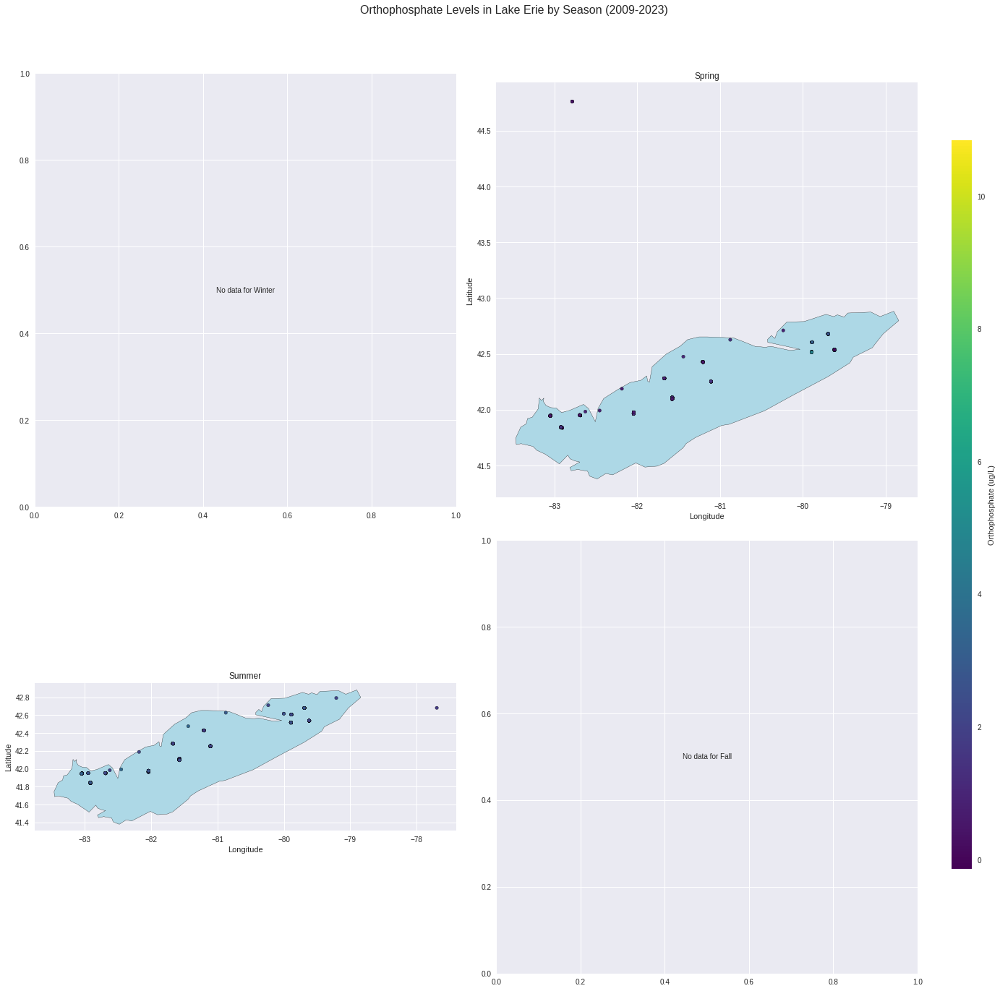

In [23]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import griddata
from shapely.geometry import Point

# Load and preprocess the data
df = pd.read_csv('resultphyschem.csv')
df['ActivityStartDate'] = pd.to_datetime(df['ActivityStartDate'])
df['Season'] = pd.cut(df['ActivityStartDate'].dt.month, 
                      bins=[0, 3, 6, 9, 12], 
                      labels=['Winter', 'Spring', 'Summer', 'Fall'])

# Filter for orthophosphate data
df = df[df['CharacteristicName'] == 'Orthophosphate']
df['ResultMeasureValue'] = pd.to_numeric(df['ResultMeasureValue'], errors='coerce')

# Create GeoDataFrame
gdf = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(df['ActivityLocation/LongitudeMeasure'], df['ActivityLocation/LatitudeMeasure']),
    crs="EPSG:4326"
)

# Load Lake Erie GeoJSON
lake_erie = gpd.read_file('lake-erie_812.geojson')

# Ensure both datasets are in the same CRS
lake_erie = lake_erie.to_crs(epsg=4326)
gdf = gdf.to_crs(epsg=4326)

# Create a function to plot for each season
def plot_season(season, ax):
    season_data = gdf[gdf['Season'] == season]
    
    if len(season_data) == 0:
        ax.text(0.5, 0.5, f"No data for {season}", ha='center', va='center', transform=ax.transAxes)
        return None
    
    # Plot Lake Erie outline
    lake_erie.plot(ax=ax, color='lightblue', edgecolor='black')
    
    # Plot the data points
    scatter = ax.scatter(season_data.geometry.x, season_data.geometry.y, 
                         c=season_data['ResultMeasureValue'], 
                         cmap='viridis', 
                         s=20, 
                         edgecolor='black')
    
    ax.set_title(f"{season}")
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    
    return scatter

# Create the plot
fig, axs = plt.subplots(2, 2, figsize=(20, 20))
axs = axs.ravel()

scatters = []
for i, season in enumerate(['Winter', 'Spring', 'Summer', 'Fall']):
    scatter = plot_season(season, axs[i])
    if scatter is not None:
        scatters.append(scatter)

# Add a colorbar if we have at least one plot
if scatters:
    cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
    fig.colorbar(scatters[0], cax=cbar_ax, label='Orthophosphate (ug/L)')

plt.suptitle('Orthophosphate Levels in Lake Erie by Season (2009-2023)', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 0.9, 0.95])
plt.show()

QhullError: QH6214 qhull input error: not enough points(1) to construct initial simplex (need 4)

While executing:  | qhull d Qt Q12 Qz Qbb Qc
Options selected for Qhull 2015.2.r 2016/01/18:
  run-id 997659149  delaunay  Qtriangulate  Q12-no-wide-dup  Qz-infinity-point
  Qbbound-last  Qcoplanar-keep  _pre-merge  _zero-centrum  Qinterior-keep


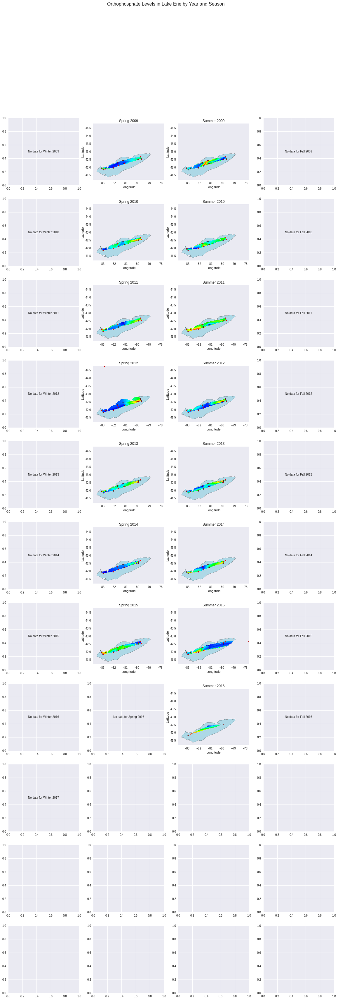

In [24]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import griddata
from shapely.geometry import Point
from matplotlib.colors import LinearSegmentedColormap

# Load and preprocess the data
df = pd.read_csv('resultphyschem.csv')
df['ActivityStartDate'] = pd.to_datetime(df['ActivityStartDate'])
df['Year'] = df['ActivityStartDate'].dt.year
df['Season'] = pd.cut(df['ActivityStartDate'].dt.month, 
                      bins=[0, 3, 6, 9, 12], 
                      labels=['Winter', 'Spring', 'Summer', 'Fall'])

# Filter for orthophosphate data
df = df[df['CharacteristicName'] == 'Orthophosphate']
df['ResultMeasureValue'] = pd.to_numeric(df['ResultMeasureValue'], errors='coerce')

# Create GeoDataFrame
gdf = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(df['ActivityLocation/LongitudeMeasure'], df['ActivityLocation/LatitudeMeasure']),
    crs="EPSG:4326"
)

# Load Lake Erie GeoJSON
lake_erie = gpd.read_file('lake-erie_812.geojson')

# Ensure both datasets are in the same CRS
lake_erie = lake_erie.to_crs(epsg=4326)
gdf = gdf.to_crs(epsg=4326)

# Create a custom colormap
colors = ['#0000ff', '#00ffff', '#00ff00', '#ffff00', '#ff0000']
n_bins = 100
cmap = LinearSegmentedColormap.from_list('custom', colors, N=n_bins)

# Create a function to plot for each year and season
def plot_year_season(year, season, ax):
    data = gdf[(gdf['Year'] == year) & (gdf['Season'] == season)]
    
    if len(data) == 0:
        ax.text(0.5, 0.5, f"No data for {season} {year}", ha='center', va='center', transform=ax.transAxes)
        return None
    
    # Create a grid for interpolation
    x = np.linspace(gdf.geometry.x.min(), gdf.geometry.x.max(), 100)
    y = np.linspace(gdf.geometry.y.min(), gdf.geometry.y.max(), 100)
    xi, yi = np.meshgrid(x, y)
    
    # Interpolate the data
    zi = griddata((data.geometry.x, data.geometry.y), 
                  data['ResultMeasureValue'], 
                  (xi, yi), 
                  method='linear')
    
    # Mask out areas outside Lake Erie
    lake_mask = lake_erie.geometry.unary_union
    mask = gpd.GeoDataFrame(geometry=[Point(xi, yi) for xi, yi in zip(xi.flatten(), yi.flatten())], crs=lake_erie.crs).within(lake_mask)
    mask = mask.values.reshape(xi.shape)
    zi = np.ma.masked_where(~mask, zi)
    
    # Plot
    lake_erie.plot(ax=ax, color='lightblue', edgecolor='black')
    im = ax.pcolormesh(xi, yi, zi, cmap=cmap, shading='auto')
    ax.scatter(data.geometry.x, data.geometry.y, c='red', s=10, edgecolor='black')
    ax.set_title(f"{season} {year}")
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    
    return im

# Get unique years and seasons
years = sorted(gdf['Year'].unique())
seasons = ['Winter', 'Spring', 'Summer', 'Fall']

# Create the plot
fig, axs = plt.subplots(len(years), 4, figsize=(20, 5*len(years)))
fig.suptitle('Orthophosphate Levels in Lake Erie by Year and Season', fontsize=16)

images = []
for i, year in enumerate(years):
    for j, season in enumerate(seasons):
        im = plot_year_season(year, season, axs[i, j])
        if im is not None:
            images.append(im)

# Add a colorbar
if images:
    cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
    fig.colorbar(images[0], cax=cbar_ax, label='Orthophosphate (ug/L)')

plt.tight_layout(rect=[0, 0.03, 0.9, 0.95])
plt.show()

QhullError: QH6214 qhull input error: not enough points(1) to construct initial simplex (need 4)

While executing:  | qhull d Qt Q12 Qz Qbb Qc
Options selected for Qhull 2015.2.r 2016/01/18:
  run-id 1002449144  delaunay  Qtriangulate  Q12-no-wide-dup  Qz-infinity-point
  Qbbound-last  Qcoplanar-keep  _pre-merge  _zero-centrum  Qinterior-keep


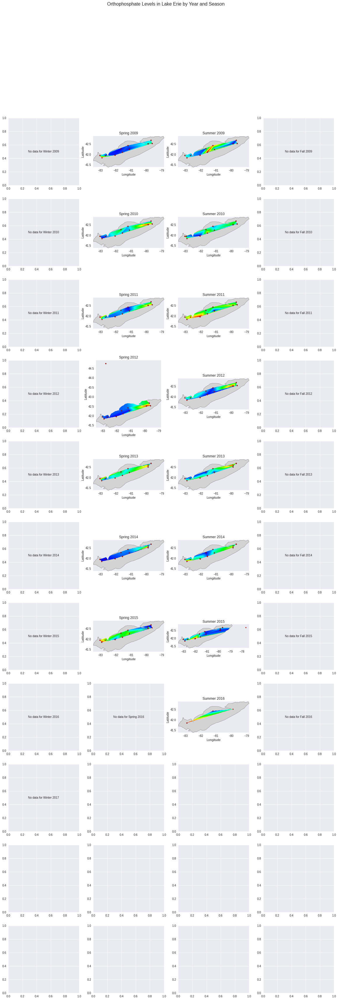

In [25]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import griddata
from shapely.geometry import Point, Polygon
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.patches import Patch

# Load and preprocess the data
df = pd.read_csv('resultphyschem.csv')
df['ActivityStartDate'] = pd.to_datetime(df['ActivityStartDate'])
df['Year'] = df['ActivityStartDate'].dt.year
df['Season'] = pd.cut(df['ActivityStartDate'].dt.month, 
                      bins=[0, 3, 6, 9, 12], 
                      labels=['Winter', 'Spring', 'Summer', 'Fall'])

# Filter for orthophosphate data
df = df[df['CharacteristicName'] == 'Orthophosphate']
df['ResultMeasureValue'] = pd.to_numeric(df['ResultMeasureValue'], errors='coerce')

# Create GeoDataFrame
gdf = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(df['ActivityLocation/LongitudeMeasure'], df['ActivityLocation/LatitudeMeasure']),
    crs="EPSG:4326"
)

# Load Lake Erie GeoJSON
lake_erie = gpd.read_file('lake-erie_812.geojson')

# Ensure both datasets are in the same CRS
lake_erie = lake_erie.to_crs(epsg=4326)
gdf = gdf.to_crs(epsg=4326)

# Create a custom colormap
colors = ['#0000ff', '#00ffff', '#00ff00', '#ffff00', '#ff0000']
n_bins = 100
cmap = LinearSegmentedColormap.from_list('custom', colors, N=n_bins)

# Create a function to plot for each year and season
def plot_year_season(year, season, ax):
    data = gdf[(gdf['Year'] == year) & (gdf['Season'] == season)]
    
    if len(data) == 0:
        ax.text(0.5, 0.5, f"No data for {season} {year}", ha='center', va='center', transform=ax.transAxes)
        return None
    
    # Create a grid for interpolation
    x = np.linspace(lake_erie.total_bounds[0], lake_erie.total_bounds[2], 500)
    y = np.linspace(lake_erie.total_bounds[1], lake_erie.total_bounds[3], 500)
    xi, yi = np.meshgrid(x, y)
    
    # Interpolate the data
    zi = griddata((data.geometry.x, data.geometry.y), 
                  data['ResultMeasureValue'], 
                  (xi, yi), 
                  method='linear')
    
    # Create a mask for Lake Erie
    lake_mask = lake_erie.geometry.unary_union
    mask = gpd.GeoDataFrame(geometry=[Point(xi, yi) for xi, yi in zip(xi.flatten(), yi.flatten())], crs=lake_erie.crs).within(lake_mask)
    mask = mask.values.reshape(xi.shape)
    
    # Apply the mask to the interpolated data
    zi_masked = np.ma.masked_where(~mask, zi)
    
    # Plot
    lake_erie.plot(ax=ax, color='lightgray', edgecolor='black')
    im = ax.pcolormesh(xi, yi, zi_masked, cmap=cmap, shading='auto')
    ax.scatter(data.geometry.x, data.geometry.y, c='red', s=10, edgecolor='black')
    ax.set_title(f"{season} {year}")
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    
    return im

# Get unique years and seasons
years = sorted(gdf['Year'].unique())
seasons = ['Winter', 'Spring', 'Summer', 'Fall']

# Create the plot
fig, axs = plt.subplots(len(years), 4, figsize=(20, 5*len(years)))
fig.suptitle('Orthophosphate Levels in Lake Erie by Year and Season', fontsize=16)

images = []
for i, year in enumerate(years):
    for j, season in enumerate(seasons):
        im = plot_year_season(year, season, axs[i, j])
        if im is not None:
            images.append(im)

# Add a colorbar
if images:
    cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
    fig.colorbar(images[0], cax=cbar_ax, label='Orthophosphate (ug/L)')

# Add legend
legend_elements = [Patch(facecolor='lightgray', edgecolor='black', label='Lake Erie'),
                   Patch(facecolor='white', edgecolor='black', label='No Data')]
fig.legend(handles=legend_elements, loc='lower right', bbox_to_anchor=(0.9, 0.1))

plt.tight_layout(rect=[0, 0.03, 0.9, 0.95])
plt.show()

QhullError: QH6214 qhull input error: not enough points(1) to construct initial simplex (need 4)

While executing:  | qhull d Qt Q12 Qz Qbb Qc
Options selected for Qhull 2015.2.r 2016/01/18:
  run-id 1007373595  delaunay  Qtriangulate  Q12-no-wide-dup  Qz-infinity-point
  Qbbound-last  Qcoplanar-keep  _pre-merge  _zero-centrum  Qinterior-keep


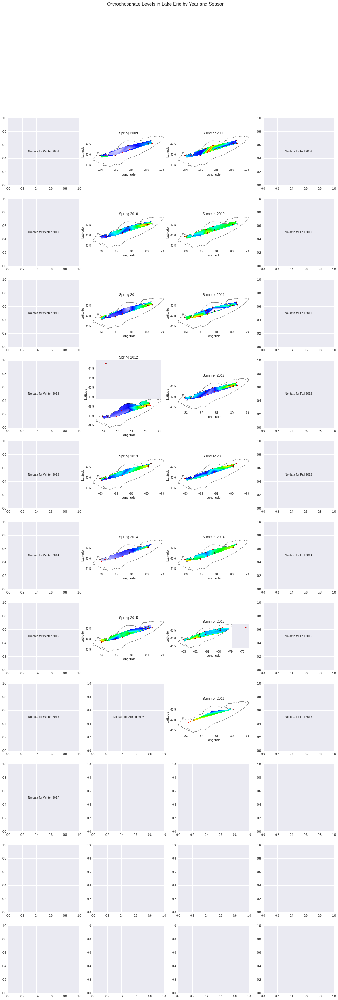

In [26]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import griddata
from shapely.geometry import Point
from matplotlib.colors import LinearSegmentedColormap

# Load and preprocess the data
df = pd.read_csv('resultphyschem.csv')
df['ActivityStartDate'] = pd.to_datetime(df['ActivityStartDate'])
df['Year'] = df['ActivityStartDate'].dt.year
df['Season'] = pd.cut(df['ActivityStartDate'].dt.month, 
                      bins=[0, 3, 6, 9, 12], 
                      labels=['Winter', 'Spring', 'Summer', 'Fall'])

# Filter for orthophosphate data
df = df[df['CharacteristicName'] == 'Orthophosphate']
df['ResultMeasureValue'] = pd.to_numeric(df['ResultMeasureValue'], errors='coerce')

# Create GeoDataFrame
gdf = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(df['ActivityLocation/LongitudeMeasure'], df['ActivityLocation/LatitudeMeasure']),
    crs="EPSG:4326"
)

# Load Lake Erie GeoJSON
lake_erie = gpd.read_file('lake-erie_812.geojson')

# Ensure both datasets are in the same CRS
lake_erie = lake_erie.to_crs(epsg=4326)
gdf = gdf.to_crs(epsg=4326)

# Create a custom colormap with zero as white
colors = ['#FFFFFF', '#0000FF', '#00FFFF', '#00FF00', '#FFFF00', '#FF0000']
n_bins = 100
cmap = LinearSegmentedColormap.from_list('custom', colors, N=n_bins)

def plot_year_season(year, season, ax):
    data = gdf[(gdf['Year'] == year) & (gdf['Season'] == season)]
    
    if len(data) == 0:
        ax.text(0.5, 0.5, f"No data for {season} {year}", ha='center', va='center', transform=ax.transAxes)
        return None
    
    # Create a grid for interpolation
    x = np.linspace(lake_erie.total_bounds[0], lake_erie.total_bounds[2], 500)
    y = np.linspace(lake_erie.total_bounds[1], lake_erie.total_bounds[3], 500)
    xi, yi = np.meshgrid(x, y)
    
    # Interpolate the data
    zi = griddata((data.geometry.x, data.geometry.y), 
                  data['ResultMeasureValue'], 
                  (xi, yi), 
                  method='linear',
                  fill_value=0)  # Set fill_value to 0 for areas with no data
    
    # Create a mask for Lake Erie
    lake_mask = lake_erie.geometry.unary_union
    mask = gpd.GeoDataFrame(geometry=[Point(xi, yi) for xi, yi in zip(xi.flatten(), yi.flatten())], crs=lake_erie.crs).within(lake_mask)
    mask = mask.values.reshape(xi.shape)
    
    # Apply the mask to the interpolated data
    zi[~mask] = 0  # Set areas outside Lake Erie to 0
    
    # Plot
    lake_erie.boundary.plot(ax=ax, color='black', linewidth=0.5)
    im = ax.pcolormesh(xi, yi, zi, cmap=cmap, shading='auto', vmin=0, vmax=np.nanmax(zi))
    ax.scatter(data.geometry.x, data.geometry.y, c='red', s=10, edgecolor='black')
    ax.set_title(f"{season} {year}")
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    
    return im

# Get unique years and seasons
years = sorted(gdf['Year'].unique())
seasons = ['Winter', 'Spring', 'Summer', 'Fall']

# Create the plot
fig, axs = plt.subplots(len(years), 4, figsize=(20, 5*len(years)))
fig.suptitle('Orthophosphate Levels in Lake Erie by Year and Season', fontsize=16)

images = []
for i, year in enumerate(years):
    for j, season in enumerate(seasons):
        im = plot_year_season(year, season, axs[i, j])
        if im is not None:
            images.append(im)

# Add a colorbar
if images:
    cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
    fig.colorbar(images[0], cax=cbar_ax, label='Orthophosphate (ug/L)')

plt.tight_layout(rect=[0, 0.03, 0.9, 0.95])
plt.show()

QhullError: QH6214 qhull input error: not enough points(1) to construct initial simplex (need 4)

While executing:  | qhull d Qt Q12 Qz Qbb Qc
Options selected for Qhull 2015.2.r 2016/01/18:
  run-id 1012701414  delaunay  Qtriangulate  Q12-no-wide-dup  Qz-infinity-point
  Qbbound-last  Qcoplanar-keep  _pre-merge  _zero-centrum  Qinterior-keep


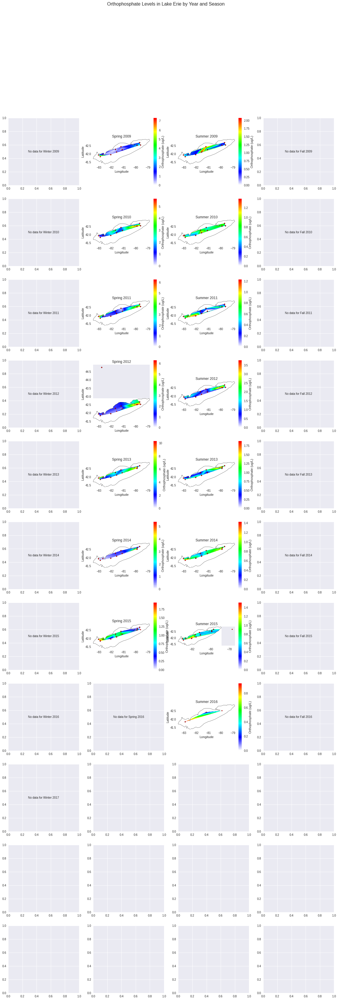

In [27]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import griddata
from shapely.geometry import Point
from matplotlib.colors import LinearSegmentedColormap

# Load and preprocess the data
df = pd.read_csv('resultphyschem.csv')
df['ActivityStartDate'] = pd.to_datetime(df['ActivityStartDate'])
df['Year'] = df['ActivityStartDate'].dt.year
df['Season'] = pd.cut(df['ActivityStartDate'].dt.month, 
                      bins=[0, 3, 6, 9, 12], 
                      labels=['Winter', 'Spring', 'Summer', 'Fall'])

# Filter for orthophosphate data
df = df[df['CharacteristicName'] == 'Orthophosphate']
df['ResultMeasureValue'] = pd.to_numeric(df['ResultMeasureValue'], errors='coerce')

# Create GeoDataFrame
gdf = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(df['ActivityLocation/LongitudeMeasure'], df['ActivityLocation/LatitudeMeasure']),
    crs="EPSG:4326"
)

# Load Lake Erie GeoJSON
lake_erie = gpd.read_file('lake-erie_812.geojson')

# Ensure both datasets are in the same CRS
lake_erie = lake_erie.to_crs(epsg=4326)
gdf = gdf.to_crs(epsg=4326)

# Create a custom colormap with zero as white
colors = ['#FFFFFF', '#0000FF', '#00FFFF', '#00FF00', '#FFFF00', '#FF0000']
n_bins = 100
cmap = LinearSegmentedColormap.from_list('custom', colors, N=n_bins)

def plot_year_season(year, season, ax):
    data = gdf[(gdf['Year'] == year) & (gdf['Season'] == season)]
    
    if len(data) == 0:
        ax.text(0.5, 0.5, f"No data for {season} {year}", ha='center', va='center', transform=ax.transAxes)
        return None
    
    # Create a grid for interpolation
    x = np.linspace(lake_erie.total_bounds[0], lake_erie.total_bounds[2], 500)
    y = np.linspace(lake_erie.total_bounds[1], lake_erie.total_bounds[3], 500)
    xi, yi = np.meshgrid(x, y)
    
    # Interpolate the data
    zi = griddata((data.geometry.x, data.geometry.y), 
                  data['ResultMeasureValue'], 
                  (xi, yi), 
                  method='linear',
                  fill_value=0)  # Set fill_value to 0 for areas with no data
    
    # Create a mask for Lake Erie
    lake_mask = lake_erie.geometry.unary_union
    mask = gpd.GeoDataFrame(geometry=[Point(xi, yi) for xi, yi in zip(xi.flatten(), yi.flatten())], crs=lake_erie.crs).within(lake_mask)
    mask = mask.values.reshape(xi.shape)
    
    # Apply the mask to the interpolated data
    zi[~mask] = 0  # Set areas outside Lake Erie to 0
    
    # Plot
    lake_erie.boundary.plot(ax=ax, color='black', linewidth=0.5)
    im = ax.pcolormesh(xi, yi, zi, cmap=cmap, shading='auto', vmin=0, vmax=np.nanmax(zi))
    ax.scatter(data.geometry.x, data.geometry.y, c='red', s=10, edgecolor='black')
    ax.set_title(f"{season} {year}")
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    
    # Add colorbar
    plt.colorbar(im, ax=ax, label='Orthophosphate (ug/L)')
    
    return im

# Get unique years and seasons
years = sorted(gdf['Year'].unique())
seasons = ['Winter', 'Spring', 'Summer', 'Fall']

# Create the plot
fig, axs = plt.subplots(len(years), 4, figsize=(20, 5*len(years)))
fig.suptitle('Orthophosphate Levels in Lake Erie by Year and Season', fontsize=16)

for i, year in enumerate(years):
    for j, season in enumerate(seasons):
        ax = axs[i, j] if len(years) > 1 else axs[j]
        plot_year_season(year, season, ax)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

QhullError: QH6214 qhull input error: not enough points(1) to construct initial simplex (need 4)

While executing:  | qhull d Qt Q12 Qz Qbb Qc
Options selected for Qhull 2015.2.r 2016/01/18:
  run-id 1017474602  delaunay  Qtriangulate  Q12-no-wide-dup  Qz-infinity-point
  Qbbound-last  Qcoplanar-keep  _pre-merge  _zero-centrum  Qinterior-keep


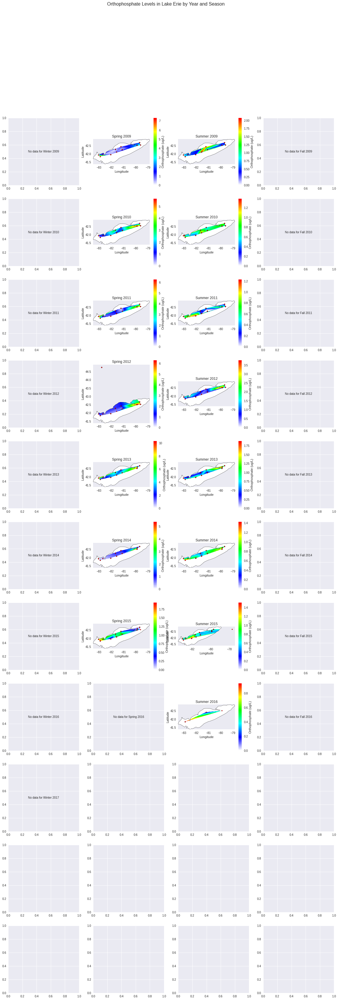

In [28]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import griddata
from shapely.geometry import Point
from matplotlib.colors import LinearSegmentedColormap

# Load and preprocess the data
df = pd.read_csv('resultphyschem.csv')
df['ActivityStartDate'] = pd.to_datetime(df['ActivityStartDate'])
df['Year'] = df['ActivityStartDate'].dt.year
df['Season'] = pd.cut(df['ActivityStartDate'].dt.month, 
                      bins=[0, 3, 6, 9, 12], 
                      labels=['Winter', 'Spring', 'Summer', 'Fall'])

# Filter for orthophosphate data
df = df[df['CharacteristicName'] == 'Orthophosphate']
df['ResultMeasureValue'] = pd.to_numeric(df['ResultMeasureValue'], errors='coerce')

# Create GeoDataFrame
gdf = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(df['ActivityLocation/LongitudeMeasure'], df['ActivityLocation/LatitudeMeasure']),
    crs="EPSG:4326"
)

# Load Lake Erie GeoJSON
lake_erie = gpd.read_file('lake-erie_812.geojson')

# Ensure both datasets are in the same CRS
lake_erie = lake_erie.to_crs(epsg=4326)
gdf = gdf.to_crs(epsg=4326)

# Create a custom colormap with zero as white
colors = ['#FFFFFF', '#0000FF', '#00FFFF', '#00FF00', '#FFFF00', '#FF0000']
n_bins = 100
cmap = LinearSegmentedColormap.from_list('custom', colors, N=n_bins)

def plot_year_season(year, season, ax):
    data = gdf[(gdf['Year'] == year) & (gdf['Season'] == season)]
    
    if len(data) == 0:
        ax.text(0.5, 0.5, f"No data for {season} {year}", ha='center', va='center', transform=ax.transAxes)
        return None
    
    # Create a grid for interpolation
    x = np.linspace(lake_erie.total_bounds[0], lake_erie.total_bounds[2], 500)
    y = np.linspace(lake_erie.total_bounds[1], lake_erie.total_bounds[3], 500)
    xi, yi = np.meshgrid(x, y)
    
    # Interpolate the data
    zi = griddata((data.geometry.x, data.geometry.y), 
                  data['ResultMeasureValue'], 
                  (xi, yi), 
                  method='linear',
                  fill_value=0)  # Set fill_value to 0 for areas with no data
    
    # Create a mask for Lake Erie
    lake_mask = lake_erie.geometry.unary_union
    mask = gpd.GeoDataFrame(geometry=[Point(xi, yi) for xi, yi in zip(xi.flatten(), yi.flatten())], crs=lake_erie.crs).within(lake_mask)
    mask = mask.values.reshape(xi.shape)
    
    # Apply the mask to the interpolated data
    zi[~mask] = np.nan  # Set areas outside Lake Erie to NaN
    
    # Plot
    lake_erie.boundary.plot(ax=ax, color='black', linewidth=0.5)
    im = ax.pcolormesh(xi, yi, zi, cmap=cmap, shading='auto', vmin=0, vmax=np.nanmax(zi))
    ax.scatter(data.geometry.x, data.geometry.y, c='red', s=10, edgecolor='black')
    ax.set_title(f"{season} {year}")
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    
    # Add colorbar
    plt.colorbar(im, ax=ax, label='Orthophosphate (ug/L)')
    
    return im

# Get unique years and seasons
years = sorted(gdf['Year'].unique())
seasons = ['Winter', 'Spring', 'Summer', 'Fall']

# Create the plot
fig, axs = plt.subplots(len(years), 4, figsize=(20, 5*len(years)))
fig.suptitle('Orthophosphate Levels in Lake Erie by Year and Season', fontsize=16)

for i, year in enumerate(years):
    for j, season in enumerate(seasons):
        ax = axs[i, j] if len(years) > 1 else axs[j]
        plot_year_season(year, season, ax)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [29]:
import geopandas as gpd

# Load the Lake Erie GeoJSON file
lake_erie = gpd.read_file('lake-erie_812.geojson')

# Get the total bounds of the GeoDataFrame
bounds = lake_erie.total_bounds

# Print the bounding coordinates
print(f"Minimum Longitude: {bounds[0]}")
print(f"Minimum Latitude: {bounds[1]}")
print(f"Maximum Longitude: {bounds[2]}")
print(f"Maximum Latitude: {bounds[3]}")

Minimum Longitude: -83.470191
Minimum Latitude: 41.382866
Maximum Longitude: -78.844947
Maximum Latitude: 42.885905


In [31]:
import geopandas as gpd

# Load Lake Erie GeoJSON file
lake_erie = gpd.read_file("lake-erie_812.geojson")

# Get bounding coordinates of the lake
bounding_coordinates = lake_erie.total_bounds  # [minx, miny, maxx, maxy]
print("Bounding Coordinates:", bounding_coordinates)


Bounding Coordinates: [-83.470191  41.382866 -78.844947  42.885905]


In [9]:
# Method 1: Read first few lines
import pandas as pd

# Read the file with tab separator
df = pd.read_csv('nutrients_erie_data', sep='\t', comment='#', header=None)

# View the first few rows
print(df.head())

# View column information
print("\nColumn Count:", len(df.columns))
print("\nColumn Types:")
print(df.dtypes)

# Method 2: Inspect first few lines manually
with open('nutrients_erie_data', 'r') as file:
    for i, line in enumerate(file):
        print(line.strip())
        if i > 10:  # Limit to first 10 lines
            break

# Method 3: Basic DataFrame information
print("\nDataFrame Info:")
df.info()


           0         1           2                   3                      4  \
0  agency_cd   site_no    datetime  119798_00300_00001  119798_00300_00001_cd   
1         5s       15s         20d                 14n                    10s   
2       USGS  03025500  2011-07-28                12.7                      A   
3       USGS  03025500  2011-07-29                13.3                      A   
4       USGS  03025500  2011-07-30                13.8                      A   

                    5                      6                   7  \
0  119799_00300_00002  119799_00300_00002_cd  119800_00300_00003   
1                 14n                    10s                 14n   
2                 5.0                      A                 8.0   
3                 5.5                      A                 8.9   
4                 5.2                      A                 9.0   

                       8  
0  119800_00300_00003_cd  
1                    10s  
2                      

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 28631 entries, 2011-07-28 to 2023-12-23
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   agency_cd   28631 non-null  object 
 1   site_no     28631 non-null  object 
 2   max_do      28631 non-null  float64
 3   max_do_cd   28631 non-null  object 
 4   min_do      28631 non-null  float64
 5   min_do_cd   28631 non-null  object 
 6   mean_do     28631 non-null  float64
 7   mean_do_cd  28631 non-null  object 
dtypes: float64(3), object(5)
memory usage: 2.0+ MB
None
             max_do        min_do       mean_do
count  28631.000000  28631.000000  28631.000000
mean      10.086828      8.866982      9.375516
std        3.068477      3.024911      2.964888
min        0.018200      0.000000      0.015000
25%        8.300000      7.200000      7.700000
50%       10.300000      8.700000      9.300000
75%       12.400000     11.200000     11.600000
max       17.700000     

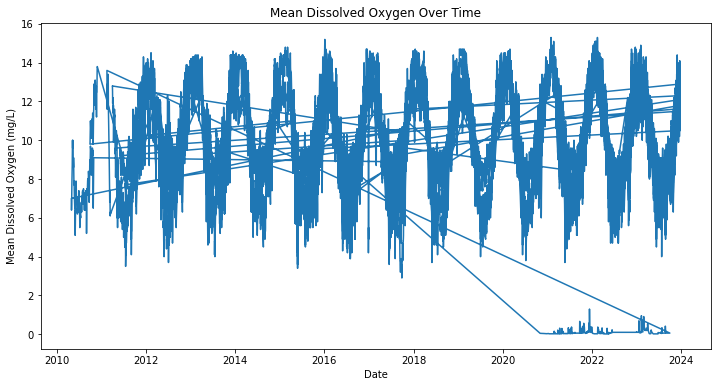

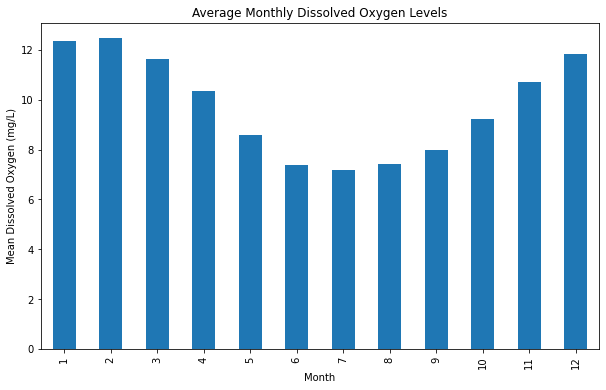

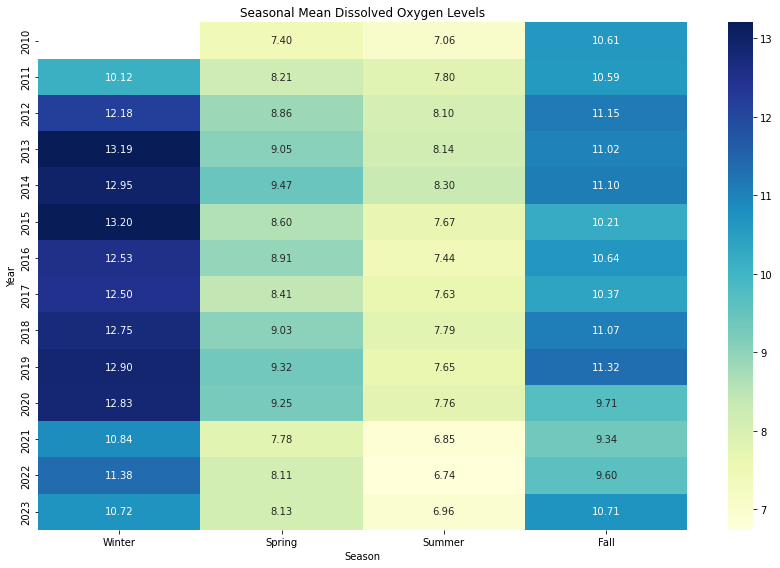

In [15]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Read the file, skipping the first two rows (header and data type)
df = pd.read_csv('nutrients_erie_data', sep='\s+', comment='#', skiprows=2, header=None)

# Assign column names
df.columns = ['agency_cd', 'site_no', 'datetime', 'max_do', 'max_do_cd', 'min_do', 'min_do_cd', 'mean_do', 'mean_do_cd']

# Remove rows where 'datetime' is not a valid date
df = df[df['datetime'].str.match(r'\d{4}-\d{2}-\d{2}')]

# Convert datetime to datetime type
df['datetime'] = pd.to_datetime(df['datetime'], format='%Y-%m-%d')

# Convert DO columns to numeric, coercing errors to NaN
for col in ['max_do', 'min_do', 'mean_do']:
    df[col] = pd.to_numeric(df[col], errors='coerce')

# Set datetime as index
df.set_index('datetime', inplace=True)

# Remove rows with missing data
df = df.dropna()

# Display basic information about the dataset
print(df.info())
print(df.describe())

# Plot time series of mean dissolved oxygen
plt.figure(figsize=(12, 6))
plt.plot(df.index, df['mean_do'])
plt.title('Mean Dissolved Oxygen Over Time')
plt.xlabel('Date')
plt.ylabel('Mean Dissolved Oxygen (mg/L)')
plt.show()

# Create a seasonal plot
df['month'] = df.index.month
seasonal_data = df.groupby('month')['mean_do'].mean()

plt.figure(figsize=(10, 6))
seasonal_data.plot(kind='bar')
plt.title('Average Monthly Dissolved Oxygen Levels')
plt.xlabel('Month')
plt.ylabel('Mean Dissolved Oxygen (mg/L)')
plt.show()

# Create a heatmap of seasonal patterns
df['year'] = df.index.year
df['season'] = pd.cut(df.index.month, bins=[0, 3, 6, 9, 12], labels=['Winter', 'Spring', 'Summer', 'Fall'])
seasonal_data = df.pivot_table(values='mean_do', index='year', columns='season', aggfunc='mean')

plt.figure(figsize=(12, 8))
sns.heatmap(seasonal_data, annot=True, cmap='YlGnBu', fmt='.2f')
plt.title('Seasonal Mean Dissolved Oxygen Levels')
plt.ylabel('Year')
plt.xlabel('Season')
plt.tight_layout()
plt.show()

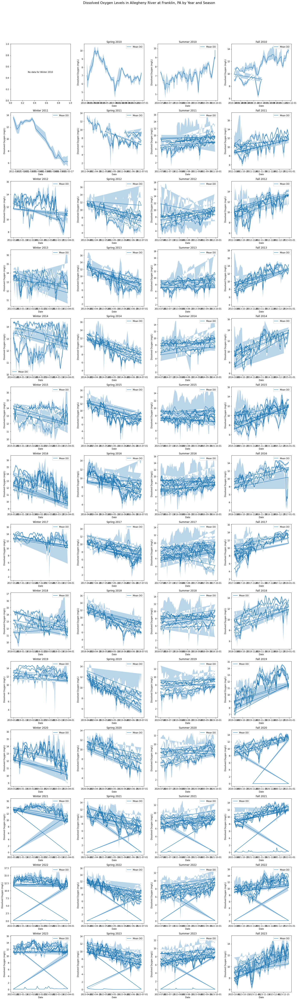

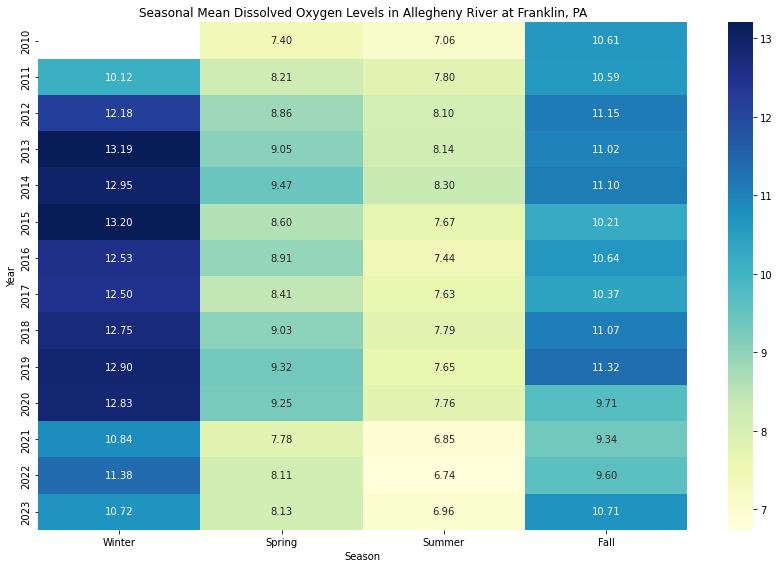

In [21]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Read the file, skipping the first two rows (header and data type)
df = pd.read_csv('nutrients_erie_data', sep='\s+', comment='#', skiprows=2, header=None)

# Assign column names
df.columns = ['agency_cd', 'site_no', 'datetime', 'max_do', 'max_do_cd', 'min_do', 'min_do_cd', 'mean_do', 'mean_do_cd']

# Convert datetime to datetime type
df['datetime'] = pd.to_datetime(df['datetime'], format='%Y-%m-%d', errors='coerce')

# Remove rows with invalid dates
df = df.dropna(subset=['datetime'])

# Add year and season columns
df['Year'] = df['datetime'].dt.year
df['Season'] = pd.cut(df['datetime'].dt.month, 
                      bins=[0, 3, 6, 9, 12], 
                      labels=['Winter', 'Spring', 'Summer', 'Fall'])

# Convert DO columns to numeric, coercing errors to NaN
for col in ['max_do', 'min_do', 'mean_do']:
    df[col] = pd.to_numeric(df[col], errors='coerce')

# Remove rows with missing data
df = df.dropna()

# Function to plot data for a specific year and season
def plot_year_season(year, season, ax):
    data = df[(df['Year'] == year) & (df['Season'] == season)]
    
    if len(data) == 0:
        ax.text(0.5, 0.5, f"No data for {season} {year}", ha='center', va='center', transform=ax.transAxes)
        return
    
    ax.plot(data['datetime'], data['mean_do'], label='Mean DO')
    ax.fill_between(data['datetime'], data['min_do'], data['max_do'], alpha=0.3)
    ax.set_title(f"{season} {year}")
    ax.set_xlabel('Date')
    ax.set_ylabel('Dissolved Oxygen (mg/L)')
    ax.legend()

# Get unique years and seasons
years = sorted(df['Year'].unique())
seasons = ['Winter', 'Spring', 'Summer', 'Fall']

# Create the plot
fig, axs = plt.subplots(len(years), 4, figsize=(20, 5*len(years)))
fig.suptitle('Dissolved Oxygen Levels in Allegheny River at Franklin, PA by Year and Season', fontsize=16)

for i, year in enumerate(years):
    for j, season in enumerate(seasons):
        ax = axs[i, j] if len(years) > 1 else axs[j]
        plot_year_season(year, season, ax)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

# Create a heatmap of seasonal patterns
seasonal_data = df.pivot_table(values='mean_do', index='Year', columns='Season', aggfunc='mean')

plt.figure(figsize=(12, 8))
sns.heatmap(seasonal_data, annot=True, cmap='YlGnBu', fmt='.2f')
plt.title('Seasonal Mean Dissolved Oxygen Levels in Allegheny River at Franklin, PA')
plt.ylabel('Year')
plt.xlabel('Season')
plt.tight_layout()
plt.show()


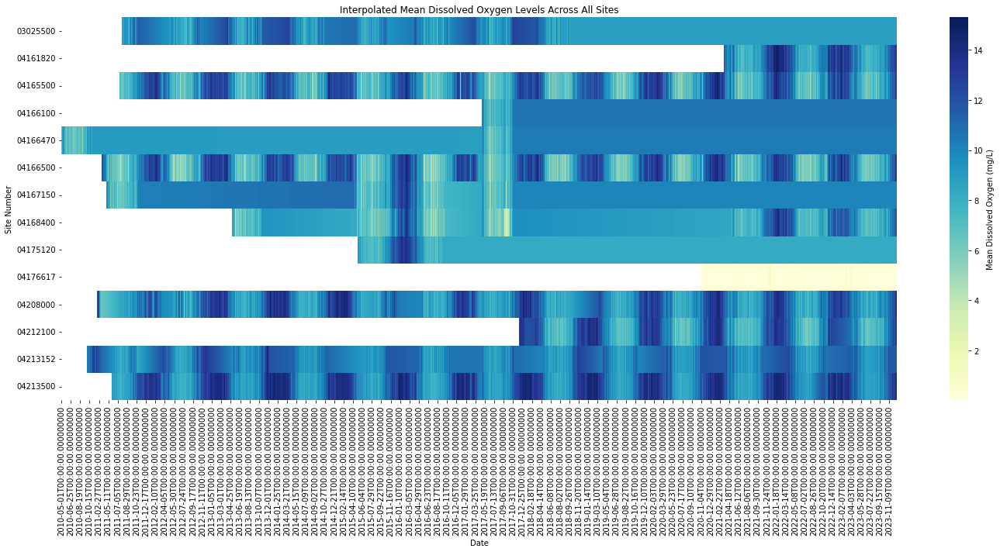

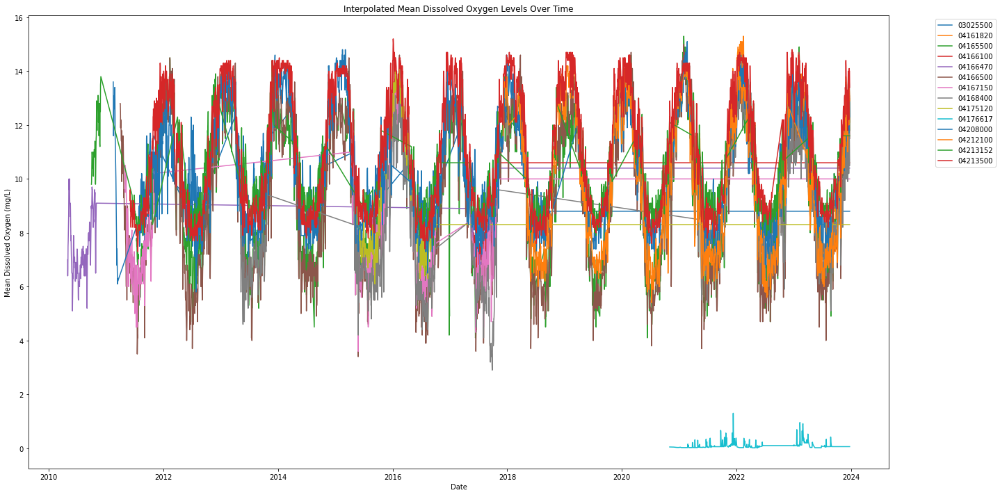

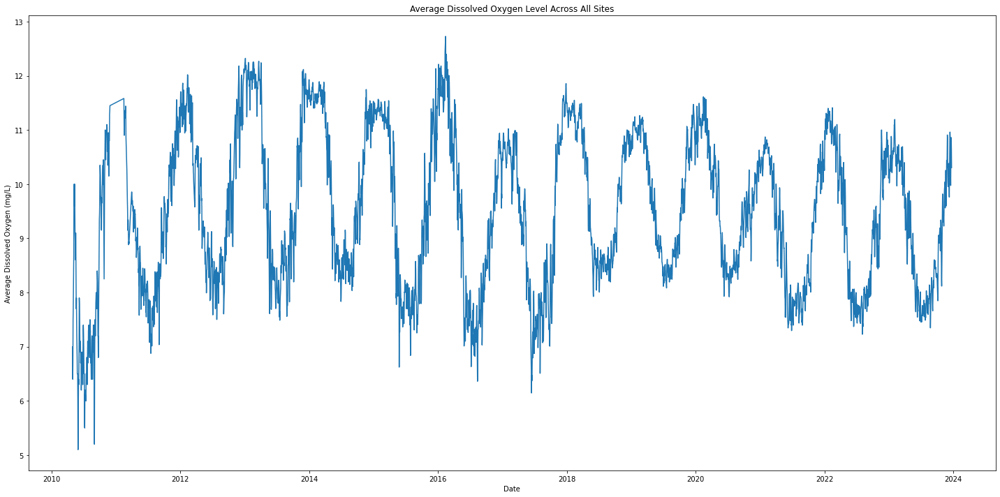

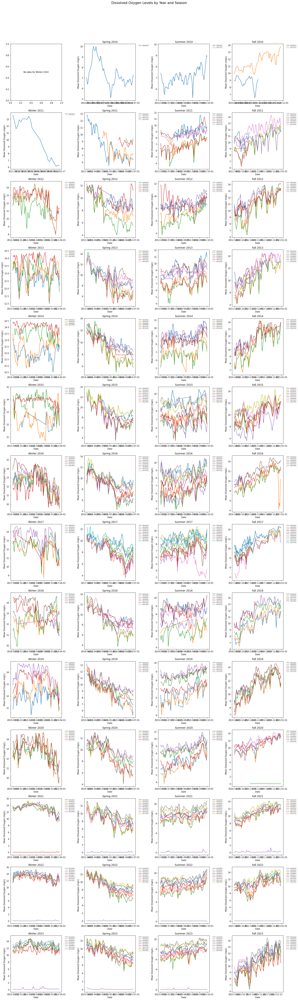

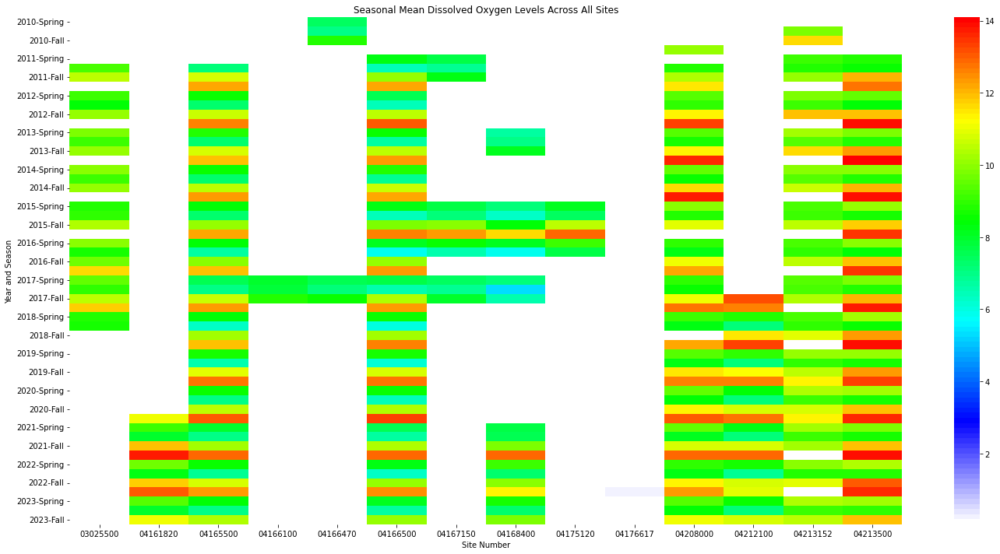

In [31]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap

# Read the file, skipping the header rows
df = pd.read_csv('nutrients_erie_data', sep='\s+', comment='#', header=None, skiprows=lambda x: x < 3)

# Assign column names
df.columns = ['agency_cd', 'site_no', 'datetime', 'max_do', 'max_do_cd', 'min_do', 'min_do_cd', 'mean_do', 'mean_do_cd']

# Convert datetime to datetime type, coercing errors to NaT
df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')

# Remove rows with invalid dates
df = df.dropna(subset=['datetime'])

# Add year and season columns
df['Year'] = df['datetime'].dt.year
df['Season'] = pd.cut(df['datetime'].dt.month, 
                      bins=[0, 3, 6, 9, 12], 
                      labels=['Winter', 'Spring', 'Summer', 'Fall'])

# Convert DO columns to numeric, coercing errors to NaN
for col in ['max_do', 'min_do', 'mean_do']:
    df[col] = pd.to_numeric(df[col], errors='coerce')

# Remove rows with missing data
df = df.dropna(subset=['mean_do'])

# Create a custom colormap
colors = ['#FFFFFF', '#0000FF', '#00FFFF', '#00FF00', '#FFFF00', '#FF0000']
n_bins = 100
cmap = LinearSegmentedColormap.from_list('custom', colors, N=n_bins)

def plot_year_season(year, season, ax):
    data = df[(df['Year'] == year) & (df['Season'] == season)]
    
    if len(data) == 0:
        ax.text(0.5, 0.5, f"No data for {season} {year}", ha='center', va='center', transform=ax.transAxes)
        return None
    
    # Plot
    for site in data['site_no'].unique():
        site_data = data[data['site_no'] == site]
        ax.plot(site_data['datetime'], site_data['mean_do'], label=site)
    
    ax.set_title(f"{season} {year}")
    ax.set_xlabel('Date')
    ax.set_ylabel('Mean Dissolved Oxygen (mg/L)')
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='xx-small')
    
    return ax

# Get unique years and seasons
years = sorted(df['Year'].unique())
seasons = ['Winter', 'Spring', 'Summer', 'Fall']

# Create the plot
fig, axs = plt.subplots(len(years), 4, figsize=(20, 5*len(years)))
fig.suptitle('Dissolved Oxygen Levels by Year and Season', fontsize=16)

for i, year in enumerate(years):
    for j, season in enumerate(seasons):
        ax = axs[i, j] if len(years) > 1 else axs[j]
        plot_year_season(year, season, ax)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

# Create a heatmap of seasonal patterns for all sites
seasonal_data = df.pivot_table(values='mean_do', index=['Year', 'Season'], columns='site_no', aggfunc='mean')

plt.figure(figsize=(20, 10))
sns.heatmap(seasonal_data, cmap=cmap, annot=False, fmt='.2f')
plt.title('Seasonal Mean Dissolved Oxygen Levels Across All Sites')
plt.ylabel('Year and Season')
plt.xlabel('Site Number')
plt.tight_layout()
plt.show()

In [32]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np

# Load the dataset
file_path = "nutrients_erie_data"  # Replace with your actual file path
data = pd.read_csv(file_path, delimiter="\t", skiprows=58)

# Clean and process the data
data['datetime'] = pd.to_datetime(data['20d'], errors='coerce')  # Replace '20d' with the actual date column name
data = data.dropna(subset=['datetime'])  # Remove rows with invalid dates

# Filter for 2009-2023
data = data[(data['datetime'] >= '2009-01-01') & (data['datetime'] <= '2023-12-31')]

# Organize data weekly
data['week'] = data['datetime'].dt.to_period('W').apply(lambda r: r.start_time)
weekly_data = data.groupby('week').mean().reset_index()

# Assign seasons
weekly_data['season'] = pd.cut(weekly_data['week'].dt.month,
                               bins=[0, 2, 5, 8, 11, 12],
                               labels=['Winter', 'Spring', 'Summer', 'Fall', 'Winter'],
                               right=False)

# Load the Lake Erie GeoJSON file
geojson_path = "lake-erie_812.geojson"  # Replace with your actual file path
lake_erie = gpd.read_file(geojson_path)

# Visualization
fig, ax = plt.subplots(figsize=(12, 8))
lake_erie.plot(ax=ax, color="lightblue", edgecolor="black")

# Scatter nutrient data (example: 'Total Phosphorus' column)
sc = ax.scatter(
    weekly_data['week'], 
    weekly_data['119798_00300_00001'],  # Replace with your nutrient concentration column
    c=weekly_data['season'].cat.codes, 
    cmap="viridis", 
    alpha=0.7
)

# Add colorbar and labels
plt.colorbar(sc, label="Season")
ax.set_title("Seasonal Nutrient Concentrations in Lake Erie (2009-2023)", fontsize=14)
ax.set_xlabel("Week", fontsize=12)
ax.set_ylabel("Nutrient Concentration (e.g., Total Phosphorus)", fontsize=12)
plt.show()


KeyError: '20d'

In [33]:
# Display all column names to find the actual column containing date information
print(data.columns)


Index(['agency_cd', 'site_no', 'datetime', '119798_00300_00001',
       '119798_00300_00001_cd', '119799_00300_00002', '119799_00300_00002_cd',
       '119800_00300_00003', '119800_00300_00003_cd'],
      dtype='object')


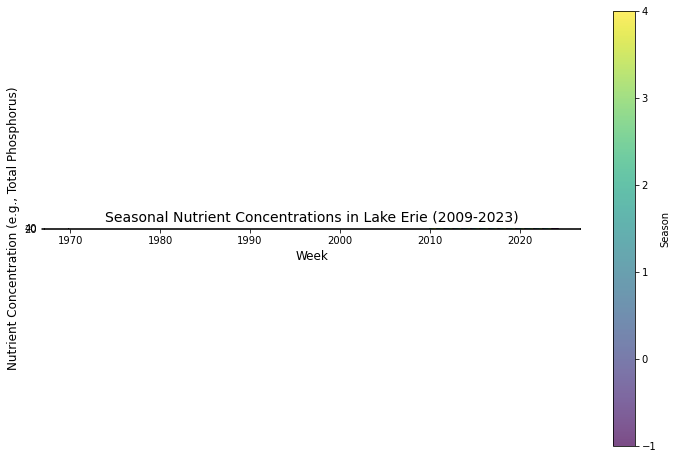

In [46]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

# Load the dataset
file_path = "nutrients_erie_data"  # Replace with your actual file path
data = pd.read_csv(file_path, delimiter="\t", skiprows=58)

# Clean and process the data
data['datetime'] = pd.to_datetime(data['datetime'], errors='coerce')  # Convert datetime column
data = data.dropna(subset=['datetime'])  # Remove rows with invalid dates

# Clean the nutrient column (replace '119798_00300_00001' with your actual column name)
data['119798_00300_00001'] = pd.to_numeric(data['119798_00300_00001'], errors='coerce')

# Remove rows with invalid nutrient values
data = data.dropna(subset=['119798_00300_00001'])

# Filter for 2009-2023
data = data[(data['datetime'] >= '2009-01-01') & (data['datetime'] <= '2023-12-31')]

# Organize data weekly
data['week'] = data['datetime'].dt.to_period('W').apply(lambda r: r.start_time)
weekly_data = data.groupby('week').agg(
    nutrient_concentration=('119798_00300_00001', 'mean')  # Use the cleaned nutrient column
).reset_index()

# Assign seasons
weekly_data['season'] = pd.cut(
    weekly_data['week'].dt.month,
    bins=[0, 2, 5, 8, 11, 12],  # Each bin represents a month range
    labels=['Winter', 'Spring', 'Summer', 'Fall', 'Late Winter'],  # Unique labels
    right=False
)

# Load the Lake Erie GeoJSON file
geojson_path = "lake-erie_812.geojson"  # Replace with your actual file path
lake_erie = gpd.read_file(geojson_path)

# Visualization
fig, ax = plt.subplots(figsize=(12, 8))
lake_erie.plot(ax=ax, color="lightblue", edgecolor="black")

# Scatter nutrient data
sc = ax.scatter(
    weekly_data['week'], 
    weekly_data['nutrient_concentration'],  # Use the grouped nutrient concentration column
    c=weekly_data['season'].cat.codes, 
    cmap="viridis", 
    alpha=0.7
)

# Add colorbar and labels
plt.colorbar(sc, label="Season")
ax.set_title("Seasonal Nutrient Concentrations in Lake Erie (2009-2023)", fontsize=14)
ax.set_xlabel("Week", fontsize=12)
ax.set_ylabel("Nutrient Concentration (e.g., Total Phosphorus)", fontsize=12)
plt.show()


In [40]:
print(weekly_data.columns)


Index(['week', 'site_no', 'datetime', 'season'], dtype='object')


In [41]:
print(data.columns)


Index(['agency_cd', 'site_no', 'datetime', '119798_00300_00001',
       '119798_00300_00001_cd', '119799_00300_00002', '119799_00300_00002_cd',
       '119800_00300_00003', '119800_00300_00003_cd', 'week'],
      dtype='object')


In [47]:
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata

# Load the nutrient dataset
file_path = "nutrients_erie_data"  # Replace with your file path
data = pd.read_csv(file_path, delimiter="\t", skiprows=58)

# Ensure datetime and clean data
data['datetime'] = pd.to_datetime(data['datetime'], errors='coerce')
data = data.dropna(subset=['datetime'])
data = data[(data['datetime'] >= '2009-01-01') & (data['datetime'] <= '2023-12-31')]

# Extract relevant columns
data['nutrient_concentration'] = pd.to_numeric(data['119798_00300_00001'], errors='coerce')
data = data.dropna(subset=['nutrient_concentration'])
data = data[['datetime', 'nutrient_concentration', 'longitude', 'latitude']]  # Replace with your lon/lat columns

# Load Lake Erie boundary
geojson_path = "lake-erie_812.geojson"  # Replace with your file path
lake_erie = gpd.read_file(geojson_path)

# Generate grid for interpolation
grid_x, grid_y = np.mgrid[
    data['longitude'].min():data['longitude'].max():100j,
    data['latitude'].min():data['latitude'].max():100j,
]

# Interpolate data (use 'nearest', 'linear', or 'cubic')
grid_z = griddata(
    (data['longitude'], data['latitude']), 
    data['nutrient_concentration'], 
    (grid_x, grid_y), 
    method='linear'
)

# Plot the results
fig, ax = plt.subplots(figsize=(12, 8))
lake_erie.plot(ax=ax, color='none', edgecolor='black')  # Plot Lake Erie boundary
contour = ax.contourf(grid_x, grid_y, grid_z, levels=50, cmap='viridis', alpha=0.7)  # Contour plot

# Add colorbar and labels
cbar = plt.colorbar(contour, ax=ax)
cbar.set_label("Nutrient Concentration (e.g., Total Phosphorus)", fontsize=12)
ax.set_title("Nutrient Concentrations in Lake Erie (2009-2023)", fontsize=14)
ax.set_xlabel("Longitude", fontsize=12)
ax.set_ylabel("Latitude", fontsize=12)
plt.show()


KeyError: "['longitude', 'latitude'] not in index"

Water Temperature

In [65]:
import pandas as pd

# Load the water temperature data
df = pd.read_csv('water_temp', sep='\s+', comment='#', header=None)

# Inspect the structure of the dataset
print(f"Number of columns: {len(df.columns)}")
print(df.head())

# Adjust column names based on the actual dataset
column_names = [
    'agency_cd', 'site_no', 'datetime', 'temperature_max', 'temperature_min',
    'temperature_mean', 'quality_code', 'extra1', 'extra2'  # Adjust based on your dataset
]
df.columns = column_names[:len(df.columns)]  # Assign only the required number of names

# Convert datetime to datetime type
df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')

# Convert temperature columns to numeric, coercing errors to NaN
for col in ['temperature_max', 'temperature_min', 'temperature_mean']:
    if col in df.columns:
        df[col] = pd.to_numeric(df[col], errors='coerce')

# Remove rows with missing datetime or temperature_mean
df = df.dropna(subset=['datetime', 'temperature_mean'])

# Inspect cleaned data
print(df.head())


Number of columns: 9
           0         1           2                   3                      4  \
0  agency_cd   site_no    datetime  119726_00010_00001  119726_00010_00001_cd   
1         5s       15s         20d                 14n                    10s   
2       USGS  03012550  2009-01-01                 1.3                      A   
3       USGS  03012550  2009-01-02                 1.3                      A   
4       USGS  03012550  2009-01-03                 1.5                      A   

                    5                      6                   7  \
0  119727_00010_00002  119727_00010_00002_cd  119728_00010_00003   
1                 14n                    10s                 14n   
2                 1.0                      A                 1.2   
3                 1.0                      A                 1.1   
4                 1.2                      A                 1.4   

                       8  
0  119728_00010_00003_cd  
1                    10s  
2 

In [66]:
import pandas as pd

# Load the water temperature data
df = pd.read_csv('water_temp', sep='\s+', comment='#', header=None)

# Assign appropriate column names
df.columns = [
    'agency_cd', 'site_no', 'datetime', 'temperature_max', 'temperature_max_cd',
    'temperature_min', 'temperature_min_cd', 'temperature_mean', 'temperature_mean_cd'
]

# Convert `datetime` to datetime type
df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')

# Convert temperature columns to numeric, coercing errors to NaN
for col in ['temperature_max', 'temperature_min', 'temperature_mean']:
    if col in df.columns:
        df[col] = pd.to_numeric(df[col], errors='coerce')

# Drop rows with missing `datetime` or `temperature_mean`
df = df.dropna(subset=['datetime', 'temperature_mean'])

# Add latitude and longitude to the dataframe based on site number
site_coords = {
    '03012550': (41.838056, -79.003611),  # Example site
    # Add all other site coordinates here...
}

df['latitude'] = df['site_no'].map(lambda x: site_coords.get(str(x), (None, None))[0])
df['longitude'] = df['site_no'].map(lambda x: site_coords.get(str(x), (None, None))[1])

# Remove rows with missing coordinates
df = df.dropna(subset=['latitude', 'longitude'])

# Save the cleaned data to a new CSV file (optional)
df.to_csv('cleaned_water_temp.csv', index=False)

# Display the first few rows of the cleaned dataset
print(df.head())


  agency_cd   site_no   datetime  temperature_max temperature_max_cd  \
2      USGS  03012550 2009-01-01              1.3                  A   
3      USGS  03012550 2009-01-02              1.3                  A   
4      USGS  03012550 2009-01-03              1.5                  A   
5      USGS  03012550 2009-01-04              1.6                  A   
6      USGS  03012550 2009-01-05              1.7                  A   

   temperature_min temperature_min_cd  temperature_mean temperature_mean_cd  \
2              1.0                  A               1.2                   A   
3              1.0                  A               1.1                   A   
4              1.2                  A               1.4                   A   
5              1.4                  A               1.5                   A   
6              1.4                  A               1.5                   A   

    latitude  longitude  
2  41.838056 -79.003611  
3  41.838056 -79.003611  
4  41.838056 -

In [67]:
# Add a 'week' column
df['week'] = df['datetime'].dt.to_period('W').apply(lambda r: r.start_time)

# Group by site and week, then calculate average temperature
weekly_data = df.groupby(['site_no', 'week']).agg({
    'temperature_mean': 'mean',
    'latitude': 'first',
    'longitude': 'first'
}).reset_index()

# Save the weekly aggregated data
weekly_data.to_csv('weekly_water_temp.csv', index=False)

# Display the first few rows of weekly data
print(weekly_data.head())


    site_no       week  temperature_mean   latitude  longitude
0  03012550 2008-12-29          1.300000  41.838056 -79.003611
1  03012550 2009-01-05          1.428571  41.838056 -79.003611
2  03012550 2009-01-12          1.442857  41.838056 -79.003611
3  03012550 2009-01-19          1.557143  41.838056 -79.003611
4  03012550 2009-01-26          1.542857  41.838056 -79.003611


In [68]:
def get_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Fall'

# Add a 'season' column
df['season'] = df['datetime'].dt.month.apply(get_season)

# Calculate average temperature by season
seasonal_data = df.groupby(['site_no', 'season']).agg({
    'temperature_mean': 'mean',
    'latitude': 'first',
    'longitude': 'first'
}).reset_index()

# Save seasonal data
seasonal_data.to_csv('seasonal_water_temp.csv', index=False)

# Display the first few rows of seasonal data
print(seasonal_data.head())


    site_no  season  temperature_mean   latitude  longitude
0  03012550    Fall         15.435255  41.838056 -79.003611
1  03012550  Spring          6.391304  41.838056 -79.003611
2  03012550  Summer         19.073234  41.838056 -79.003611
3  03012550  Winter          2.930929  41.838056 -79.003611


In [74]:
for season in ['Winter', 'Spring', 'Summer', 'Fall']:
    season_data = df[df['season'] == season]
    print(f"{season}: {len(season_data)} records")
    print(season_data[['latitude', 'longitude', 'temperature_mean']].head())


Winter: 1345 records
    latitude  longitude  temperature_mean
2  41.838056 -79.003611               1.2
3  41.838056 -79.003611               1.1
4  41.838056 -79.003611               1.4
5  41.838056 -79.003611               1.5
6  41.838056 -79.003611               1.5
Spring: 1380 records
     latitude  longitude  temperature_mean
61  41.838056 -79.003611               1.1
62  41.838056 -79.003611               0.8
63  41.838056 -79.003611               0.9
64  41.838056 -79.003611               1.1
65  41.838056 -79.003611               1.4
Summer: 1345 records
      latitude  longitude  temperature_mean
153  41.838056 -79.003611              11.1
154  41.838056 -79.003611              11.1
155  41.838056 -79.003611              12.1
156  41.838056 -79.003611              13.7
157  41.838056 -79.003611              15.3
Fall: 1353 records
      latitude  longitude  temperature_mean
245  41.838056 -79.003611              20.5
246  41.838056 -79.003611              20.5
247  41.8380

In [75]:
x = np.linspace(lake_erie.total_bounds[0], lake_erie.total_bounds[2], 100)
y = np.linspace(lake_erie.total_bounds[1], lake_erie.total_bounds[3], 100)
xi, yi = np.meshgrid(x, y)


In [77]:
# Bin data into spatial clusters
df['lat_bin'] = (df['latitude'] // 0.1) * 0.1  # Adjust bin size as needed
df['lon_bin'] = (df['longitude'] // 0.1) * 0.1

# Aggregate by bins
aggregated_data = df.groupby(['lat_bin', 'lon_bin']).agg({
    'temperature_mean': 'mean'
}).reset_index()

# Use aggregated_data for interpolation


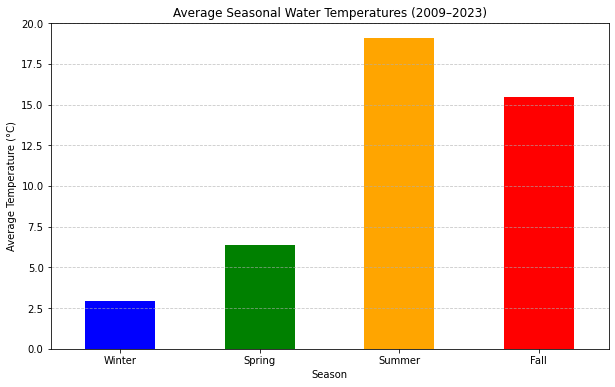

In [80]:
import matplotlib.pyplot as plt

# Compute average temperature for each season
seasonal_avg = df.groupby('season')['temperature_mean'].mean().reindex(['Winter', 'Spring', 'Summer', 'Fall'])

# Plot a bar chart for seasonal averages
plt.figure(figsize=(10, 6))
seasonal_avg.plot(kind='bar', color=['blue', 'green', 'orange', 'red'])
plt.title('Average Seasonal Water Temperatures (2009–2023)')
plt.xlabel('Season')
plt.ylabel('Average Temperature (°C)')
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()



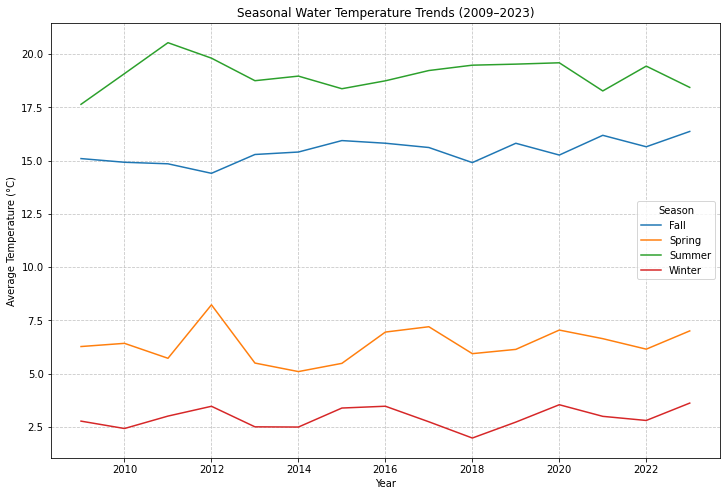

In [81]:
# Extract year from datetime and group by season and year
df['year'] = df['datetime'].dt.year
seasonal_trends = df.groupby(['year', 'season'])['temperature_mean'].mean().unstack()

# Plot time series
plt.figure(figsize=(12, 8))
seasonal_trends.plot(ax=plt.gca())
plt.title('Seasonal Water Temperature Trends (2009–2023)')
plt.xlabel('Year')
plt.ylabel('Average Temperature (°C)')
plt.legend(title='Season')
plt.grid(axis='both', linestyle='--', alpha=0.7)
plt.show()


In [10]:
import pandas as pd

# Load cleaned seasonal data
df = pd.read_csv('seasonal_water_temp.csv')

# Check the dataset structure
print(df.head())
print(df.info())



   site_no  season  temperature_mean   latitude  longitude
0  3012550    Fall         15.435255  41.838056 -79.003611
1  3012550  Spring          6.391304  41.838056 -79.003611
2  3012550  Summer         19.073234  41.838056 -79.003611
3  3012550  Winter          2.930929  41.838056 -79.003611
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4 entries, 0 to 3
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   site_no           4 non-null      int64  
 1   season            4 non-null      object 
 2   temperature_mean  4 non-null      float64
 3   latitude          4 non-null      float64
 4   longitude         4 non-null      float64
dtypes: float64(3), int64(1), object(1)
memory usage: 288.0+ bytes
None


In [11]:
# Check data for each season
for season in ['Winter', 'Spring', 'Summer', 'Fall']:
    season_data = df[df['season'] == season]
    print(f"{season}: {len(season_data)} records")


Winter: 1 records
Spring: 1 records
Summer: 1 records
Fall: 1 records


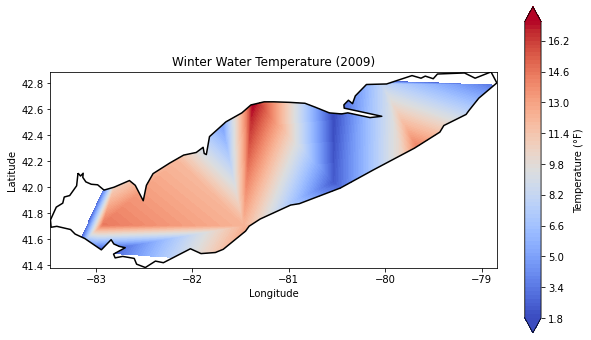

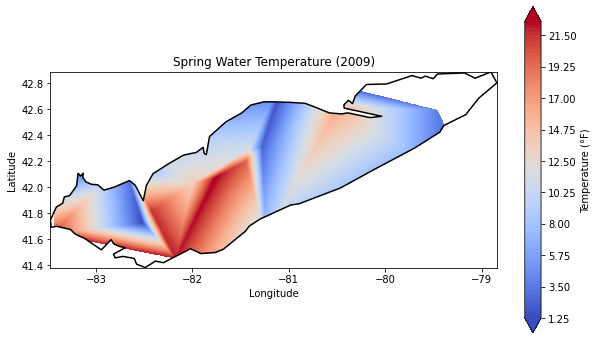

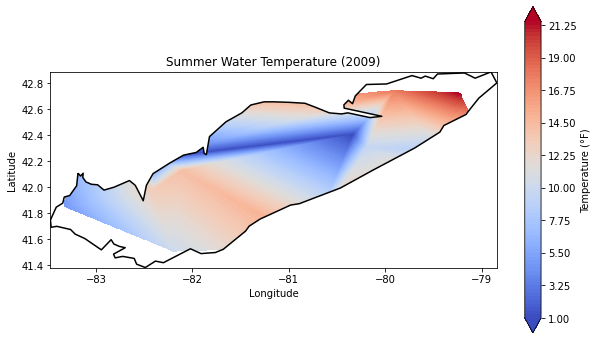

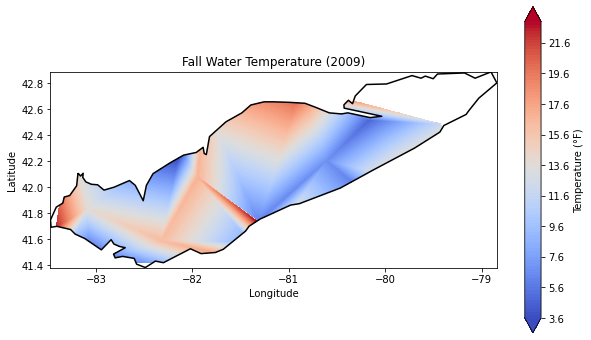

KeyboardInterrupt: 

In [3]:
import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
from scipy.interpolate import griddata

# Load cleaned data
df = pd.read_csv('cleaned_water_temp.csv')
df['datetime'] = pd.to_datetime(df['datetime'])
df['year'] = df['datetime'].dt.year

def get_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Fall'

df['season'] = df['datetime'].dt.month.apply(get_season)

# Load Lake Erie GeoJSON
lake_erie = gpd.read_file('lake-erie_812.geojson')

# Add dummy points
def add_dummy_points(df, lake_erie, num_points=1000):
    bounds = lake_erie.total_bounds
    dummy_lons = np.random.uniform(bounds[0], bounds[2], num_points)
    dummy_lats = np.random.uniform(bounds[1], bounds[3], num_points)
    dummy_temps = np.random.uniform(df['temperature_mean'].min(), df['temperature_mean'].max(), num_points)
    dummy_seasons = np.random.choice(['Winter', 'Spring', 'Summer', 'Fall'], num_points)
    dummy_years = np.random.randint(df['year'].min(), df['year'].max() + 1, num_points)
    dummy_data = pd.DataFrame({
        'latitude': dummy_lats,
        'longitude': dummy_lons,
        'temperature_mean': dummy_temps,
        'season': dummy_seasons,
        'year': dummy_years
    })
    return pd.concat([df, dummy_data], ignore_index=True)

combined_data = add_dummy_points(df, lake_erie)

# Function to plot
def plot_smooth_seasonal_temperature(data, season, year):
    season_data = data[(data['season'] == season) & (data['year'] == year)]
    if season_data.empty:
        print(f"No data for {season} {year}")
        return

    x = np.linspace(lake_erie.total_bounds[0], lake_erie.total_bounds[2], 500)
    y = np.linspace(lake_erie.total_bounds[1], lake_erie.total_bounds[3], 500)
    xi, yi = np.meshgrid(x, y)

    # Add jitter to avoid coplanarity
    jitter = np.random.uniform(-0.001, 0.001, size=season_data[['longitude', 'latitude']].shape)
    points = season_data[['longitude', 'latitude']].values + jitter
    values = season_data['temperature_mean'].values

    try:
        zi = griddata(points, values, (xi, yi), method='linear')
    except Exception as e:
        print(f"Interpolation failed for {season} {year}: {e}")
        return

    # Mask outside the lake boundary
    mask = np.zeros_like(zi, dtype=bool)
    for i in range(zi.shape[0]):
        for j in range(zi.shape[1]):
            point = gpd.points_from_xy([xi[0, j]], [yi[i, 0]], crs="EPSG:4326")
            mask[i, j] = not lake_erie.contains(point[0]).any()
    zi = np.ma.masked_where(mask, zi)

    # Plot
    plt.figure(figsize=(10, 6))
    plt.contourf(xi, yi, zi, levels=100, cmap='coolwarm', extend='both')
    lake_erie.boundary.plot(ax=plt.gca(), color='black')
    plt.title(f'{season} Water Temperature ({year})')
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    cbar = plt.colorbar()
    cbar.set_label('Temperature (°F)')
    plt.show()

# Generate plots
for year in range(2009, 2024):
    for season in ['Winter', 'Spring', 'Summer', 'Fall']:
        plot_smooth_seasonal_temperature(combined_data, season, year)


Nutrient Data 

QhullError: QH6214 qhull input error: not enough points(1) to construct initial simplex (need 4)

While executing:  | qhull d Qc Qz Qt Qbb Q12
Options selected for Qhull 2015.2.r 2016/01/18:
  run-id 1598795118  delaunay  Qcoplanar-keep  Qz-infinity-point  Qtriangulate
  Qbbound-last  Q12-no-wide-dup  _pre-merge  _zero-centrum  Qinterior-keep


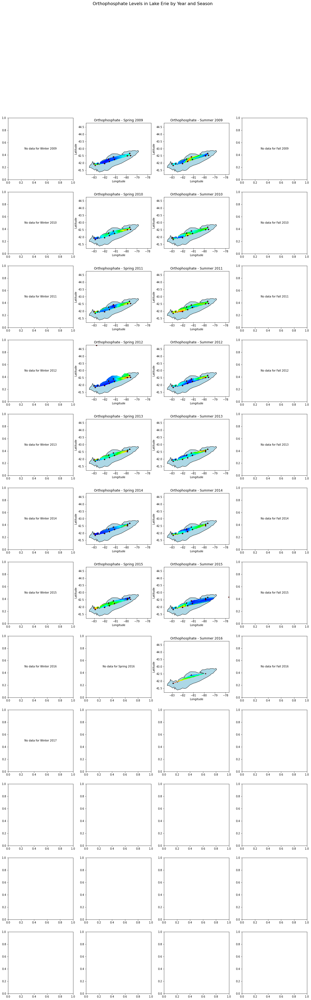

In [4]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import griddata
from shapely.geometry import Point
from matplotlib.colors import LinearSegmentedColormap

# Load and preprocess the data
df = pd.read_csv('resultphyschem.csv')
df['ActivityStartDate'] = pd.to_datetime(df['ActivityStartDate'])
df['Year'] = df['ActivityStartDate'].dt.year
df['Season'] = pd.cut(df['ActivityStartDate'].dt.month, 
                      bins=[0, 3, 6, 9, 12], 
                      labels=['Winter', 'Spring', 'Summer', 'Fall'])

# Convert ResultMeasureValue to numeric
df['ResultMeasureValue'] = pd.to_numeric(df['ResultMeasureValue'], errors='coerce')

# Create GeoDataFrame
gdf = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(df['ActivityLocation/LongitudeMeasure'], df['ActivityLocation/LatitudeMeasure']),
    crs="EPSG:4326"
)

# Load Lake Erie GeoJSON
lake_erie = gpd.read_file('lake-erie_812.geojson')
lake_erie = lake_erie.to_crs(epsg=4326)
lake_mask = lake_erie.geometry.unary_union  # Unified lake boundary

# Custom colormap
colors = ['#0000ff', '#00ffff', '#00ff00', '#ffff00', '#ff0000']
cmap = LinearSegmentedColormap.from_list('custom', colors, N=100)

# Function to plot for each year, season, and nutrient
def plot_year_season_nutrient(data, nutrient, year, season, ax):
    data = data[(data['CharacteristicName'] == nutrient) & 
                (data['Year'] == year) & 
                (data['Season'] == season)]
    
    if data.empty:
        ax.text(0.5, 0.5, f"No data for {season} {year}", ha='center', va='center', transform=ax.transAxes)
        return None
    
    # Create grid for interpolation
    x = np.linspace(gdf.geometry.x.min(), gdf.geometry.x.max(), 200)
    y = np.linspace(gdf.geometry.y.min(), gdf.geometry.y.max(), 200)
    xi, yi = np.meshgrid(x, y)
    
    # Interpolate data
    zi = griddata((data.geometry.x, data.geometry.y), 
                  data['ResultMeasureValue'], 
                  (xi, yi), 
                  method='linear')
    
    # Mask areas outside Lake Erie
    mask = np.array([Point(lon, lat).within(lake_mask) for lon, lat in zip(xi.flatten(), yi.flatten())])
    mask = mask.reshape(xi.shape)
    zi = np.ma.masked_where(~mask, zi)
    
    # Plot
    lake_erie.plot(ax=ax, color='lightblue', edgecolor='black')
    im = ax.pcolormesh(xi, yi, zi, cmap=cmap, shading='auto')
    ax.scatter(data.geometry.x, data.geometry.y, c='red', s=10, edgecolor='black')
    ax.set_title(f"{nutrient} - {season} {year}")
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    
    return im

# Unique nutrients
nutrients = gdf['CharacteristicName'].unique()

# Generate plots for each nutrient
for nutrient in nutrients:
    years = sorted(gdf['Year'].unique())
    seasons = ['Winter', 'Spring', 'Summer', 'Fall']
    
    fig, axs = plt.subplots(len(years), 4, figsize=(20, 5*len(years)))
    fig.suptitle(f'{nutrient} Levels in Lake Erie by Year and Season', fontsize=16)
    
    images = []
    for i, year in enumerate(years):
        for j, season in enumerate(seasons):
            im = plot_year_season_nutrient(gdf, nutrient, year, season, axs[i, j])
            if im is not None:
                images.append(im)
    
    # Add colorbar
    if images:
        cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
        fig.colorbar(images[0], cax=cbar_ax, label=f'{nutrient} (ug/L)')
    
    plt.tight_layout(rect=[0, 0.03, 0.9, 0.95])
    plt.savefig(f'{nutrient}_levels_lake_erie.png', dpi=300)
    plt.show()


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:114: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


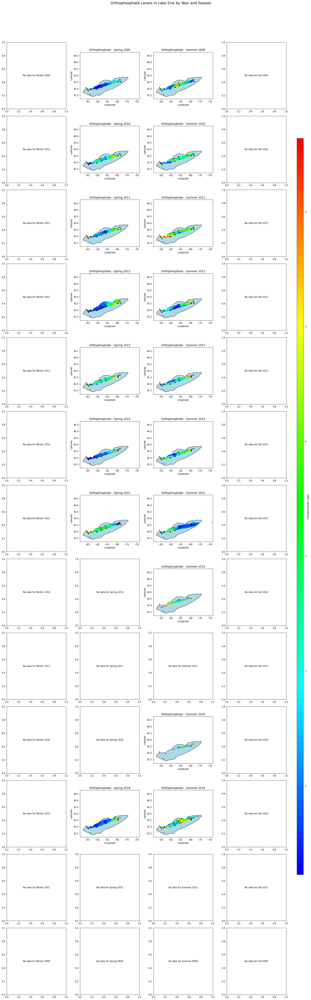

QhullError: QH6154 Qhull precision error: Initial simplex is flat (facet 2 is coplanar with the interior point)

While executing:  | qhull d Qc Qz Qt Qbb Q12
Options selected for Qhull 2015.2.r 2016/01/18:
  run-id 1601870799  delaunay  Qcoplanar-keep  Qz-infinity-point  Qtriangulate
  Qbbound-last  Q12-no-wide-dup  _pre-merge  _zero-centrum  Qinterior-keep
  Pgood  _max-width  3  Error-roundoff 1e-13  _one-merge 7.3e-13
  Visible-distance 2.1e-13  U-coplanar-distance 2.1e-13  Width-outside 4.2e-13
  _wide-facet 1.3e-12

precision problems (corrected unless 'Q0' or an error)
      2 flipped facets
      2 degenerate hyperplanes recomputed with gaussian elimination
      4 nearly singular or axis-parallel hyperplanes
      2 zero divisors during back substitute
      2 zero divisors during gaussian elimination

The input to qhull appears to be less than 3 dimensional, or a
computation has overflowed.

Qhull could not construct a clearly convex simplex from points:
- p2(v3):   -80    43     0
- p4(v2):   -81    42     3
- p0(v1):   -80    43     0
- p1(v0):   -83    42     1

The center point is coplanar with a facet, or a vertex is coplanar
with a neighboring facet.  The maximum round off error for
computing distances is 1e-13.  The center point, facets and distances
to the center point are as follows:

center point   -81.03    42.26     1.01

facet p4 p0 p1 distance= -5.7e-15
facet p2 p0 p1 distance=    0
facet p2 p4 p1 distance= -1.4e-15
facet p2 p4 p0 distance= -1.4e-14

These points either have a maximum or minimum x-coordinate, or
they maximize the determinant for k coordinates.  Trial points
are first selected from points that maximize a coordinate.

The min and max coordinates for each dimension are:
  0:    -82.92  -2.225e-308  difference= 82.92
  1:     41.84     42.52  difference= 0.677
  2:         0     3.024  difference= 3.024

If the input should be full dimensional, you have several options that
may determine an initial simplex:
  - use 'QJ'  to joggle the input and make it full dimensional
  - use 'QbB' to scale the points to the unit cube
  - use 'QR0' to randomly rotate the input for different maximum points
  - use 'Qs'  to search all points for the initial simplex
  - use 'En'  to specify a maximum roundoff error less than 1e-13.
  - trace execution with 'T3' to see the determinant for each point.

If the input is lower dimensional:
  - use 'QJ' to joggle the input and make it full dimensional
  - use 'Qbk:0Bk:0' to delete coordinate k from the input.  You should
    pick the coordinate with the least range.  The hull will have the
    correct topology.
  - determine the flat containing the points, rotate the points
    into a coordinate plane, and delete the other coordinates.
  - add one or more points to make the input full dimensional.


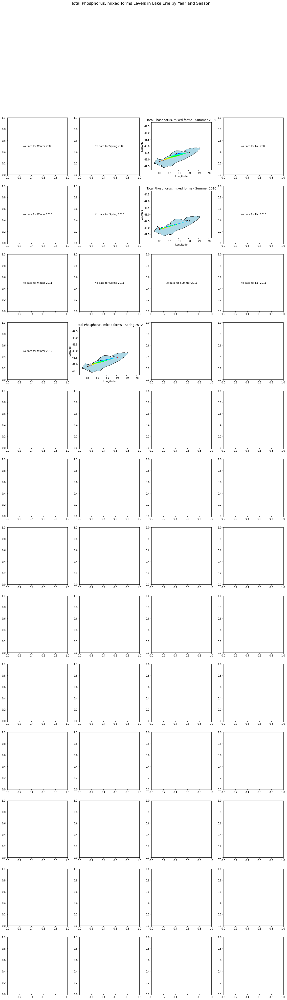

In [5]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import griddata
from shapely.geometry import Point
from matplotlib.colors import LinearSegmentedColormap

# Load and preprocess the data
df = pd.read_csv('resultphyschem.csv')
df['ActivityStartDate'] = pd.to_datetime(df['ActivityStartDate'])
df['Year'] = df['ActivityStartDate'].dt.year
df['Season'] = pd.cut(df['ActivityStartDate'].dt.month, 
                      bins=[0, 3, 6, 9, 12], 
                      labels=['Winter', 'Spring', 'Summer', 'Fall'])

# Convert ResultMeasureValue to numeric
df['ResultMeasureValue'] = pd.to_numeric(df['ResultMeasureValue'], errors='coerce')

# Create GeoDataFrame
gdf = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(df['ActivityLocation/LongitudeMeasure'], df['ActivityLocation/LatitudeMeasure']),
    crs="EPSG:4326"
)

# Load Lake Erie GeoJSON
lake_erie = gpd.read_file('lake-erie_812.geojson')
lake_erie = lake_erie.to_crs(epsg=4326)
lake_mask = lake_erie.geometry.unary_union  # Unified lake boundary

# Custom colormap
colors = ['#0000ff', '#00ffff', '#00ff00', '#ffff00', '#ff0000']
cmap = LinearSegmentedColormap.from_list('custom', colors, N=100)

# Function to add dummy points
def add_dummy_points(data):
    """Add dummy points inside Lake Erie for sparse data."""
    bounds = lake_erie.total_bounds
    x_dummy = np.linspace(bounds[0], bounds[2], 10)  # Generate 10 dummy points
    y_dummy = np.linspace(bounds[1], bounds[3], 10)
    points = [Point(x, y) for x in x_dummy for y in y_dummy if Point(x, y).within(lake_mask)]
    
    dummy_df = pd.DataFrame({
        'Year': [9999] * len(points),
        'Season': ['Dummy'] * len(points),
        'ResultMeasureValue': [0] * len(points),  # Neutral value for visualization
        'geometry': points
    })
    dummy_gdf = gpd.GeoDataFrame(dummy_df, crs="EPSG:4326")
    return pd.concat([data, dummy_gdf])

# Add dummy points to the GeoDataFrame
gdf = add_dummy_points(gdf)

# Function to plot for each year, season, and nutrient
def plot_year_season_nutrient(data, nutrient, year, season, ax):
    data = data[(data['CharacteristicName'] == nutrient) & 
                (data['Year'] == year) & 
                (data['Season'] == season)]
    
    if len(data) < 4:  # Check for sufficient data points
        ax.text(0.5, 0.5, f"No data for {season} {year}", ha='center', va='center', transform=ax.transAxes)
        return None
    
    # Create grid for interpolation
    x = np.linspace(gdf.geometry.x.min(), gdf.geometry.x.max(), 200)
    y = np.linspace(gdf.geometry.y.min(), gdf.geometry.y.max(), 200)
    xi, yi = np.meshgrid(x, y)
    
    # Interpolate data
    zi = griddata((data.geometry.x, data.geometry.y), 
                  data['ResultMeasureValue'], 
                  (xi, yi), 
                  method='linear')
    
    # Mask areas outside Lake Erie
    mask = np.array([Point(lon, lat).within(lake_mask) for lon, lat in zip(xi.flatten(), yi.flatten())])
    mask = mask.reshape(xi.shape)
    zi = np.ma.masked_where(~mask, zi)
    
    # Plot
    lake_erie.plot(ax=ax, color='lightblue', edgecolor='black')
    im = ax.pcolormesh(xi, yi, zi, cmap=cmap, shading='auto')
    ax.scatter(data.geometry.x, data.geometry.y, c='red', s=10, edgecolor='black')
    ax.set_title(f"{nutrient} - {season} {year}")
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    
    return im

# Unique nutrients
nutrients = gdf['CharacteristicName'].unique()

# Generate plots for each nutrient
for nutrient in nutrients:
    years = sorted(gdf['Year'].unique())
    seasons = ['Winter', 'Spring', 'Summer', 'Fall']
    
    fig, axs = plt.subplots(len(years), 4, figsize=(20, 5*len(years)))
    fig.suptitle(f'{nutrient} Levels in Lake Erie by Year and Season', fontsize=16)
    
    images = []
    for i, year in enumerate(years):
        for j, season in enumerate(seasons):
            im = plot_year_season_nutrient(gdf, nutrient, year, season, axs[i, j])
            if im is not None:
                images.append(im)
    
    # Add colorbar
    if images:
        cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
        fig.colorbar(images[0], cax=cbar_ax, label=f'{nutrient} (ug/L)')
    
    plt.tight_layout(rect=[0, 0.03, 0.9, 0.95])
    plt.savefig(f'{nutrient}_levels_lake_erie.png', dpi=300)
    plt.show()


QhullError: QH6154 Qhull precision error: Initial simplex is flat (facet 2 is coplanar with the interior point)

While executing:  | qhull d Qc Qz Qt Qbb Q12
Options selected for Qhull 2015.2.r 2016/01/18:
  run-id 1620375306  delaunay  Qcoplanar-keep  Qz-infinity-point  Qtriangulate
  Qbbound-last  Q12-no-wide-dup  _pre-merge  _zero-centrum  Qinterior-keep
  Pgood  _max-width 1.7  Error-roundoff 1e-13  _one-merge 7.3e-13
  Visible-distance 2.1e-13  U-coplanar-distance 2.1e-13  Width-outside 4.2e-13
  _wide-facet 1.2e-12

precision problems (corrected unless 'Q0' or an error)
      2 flipped facets
      2 degenerate hyperplanes recomputed with gaussian elimination
      4 nearly singular or axis-parallel hyperplanes
      2 zero divisors during back substitute
      2 zero divisors during gaussian elimination

The input to qhull appears to be less than 3 dimensional, or a
computation has overflowed.

Qhull could not construct a clearly convex simplex from points:
- p1(v3):   -83    42  0.36
- p5(v2):   -83    42   1.7
- p3(v1):   -81    42     0
- p0(v0):   -83    42  0.36

The center point is coplanar with a facet, or a vertex is coplanar
with a neighboring facet.  The maximum round off error for
computing distances is 1e-13.  The center point, facets and distances
to the center point are as follows:

center point    -82.4    42.02   0.6103

facet p5 p3 p0 distance= -6.1e-15
facet p1 p3 p0 distance=    0
facet p1 p5 p0 distance=    0
facet p1 p5 p3 distance= -6.1e-15

These points either have a maximum or minimum x-coordinate, or
they maximize the determinant for k coordinates.  Trial points
are first selected from points that maximize a coordinate.

The min and max coordinates for each dimension are:
  0:    -82.92  -2.225e-308  difference= 82.92
  1:     41.84     42.43  difference= 0.5832
  2:         0     1.714  difference= 1.714

If the input should be full dimensional, you have several options that
may determine an initial simplex:
  - use 'QJ'  to joggle the input and make it full dimensional
  - use 'QbB' to scale the points to the unit cube
  - use 'QR0' to randomly rotate the input for different maximum points
  - use 'Qs'  to search all points for the initial simplex
  - use 'En'  to specify a maximum roundoff error less than 1e-13.
  - trace execution with 'T3' to see the determinant for each point.

If the input is lower dimensional:
  - use 'QJ' to joggle the input and make it full dimensional
  - use 'Qbk:0Bk:0' to delete coordinate k from the input.  You should
    pick the coordinate with the least range.  The hull will have the
    correct topology.
  - determine the flat containing the points, rotate the points
    into a coordinate plane, and delete the other coordinates.
  - add one or more points to make the input full dimensional.


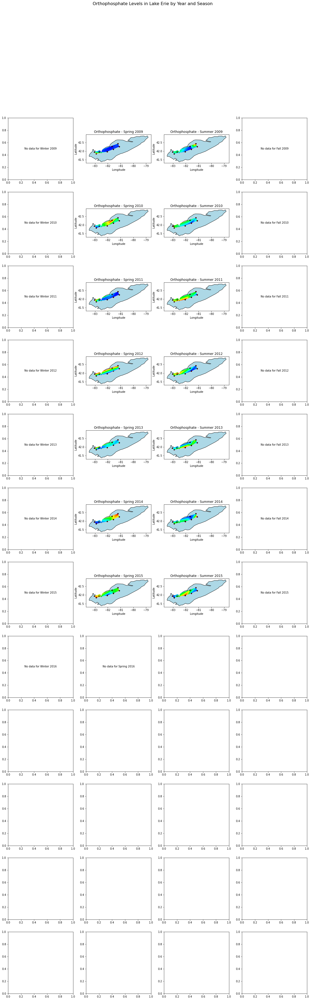

In [6]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import griddata
from shapely.geometry import Point
from matplotlib.colors import LinearSegmentedColormap

# Load and preprocess the data
df = pd.read_csv('cleaned_nutrient.csv')
df['ActivityStartDate'] = pd.to_datetime(df['ActivityStartDate'])
df['Year'] = df['ActivityStartDate'].dt.year
df['Season'] = pd.cut(df['ActivityStartDate'].dt.month, 
                      bins=[0, 3, 6, 9, 12], 
                      labels=['Winter', 'Spring', 'Summer', 'Fall'])

# Convert ResultMeasureValue to numeric
df['ResultMeasureValue'] = pd.to_numeric(df['ResultMeasureValue'], errors='coerce')

# Create GeoDataFrame
gdf = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(df['ActivityLocation/LongitudeMeasure'], df['ActivityLocation/LatitudeMeasure']),
    crs="EPSG:4326"
)

# Load Lake Erie GeoJSON
lake_erie = gpd.read_file('lake-erie_812.geojson')
lake_erie = lake_erie.to_crs(epsg=4326)
lake_mask = lake_erie.geometry.unary_union  # Unified lake boundary

# Custom colormap
colors = ['#0000ff', '#00ffff', '#00ff00', '#ffff00', '#ff0000']
cmap = LinearSegmentedColormap.from_list('custom', colors, N=100)

# Function to add dummy points
def add_dummy_points(data):
    """Add dummy points inside Lake Erie for sparse data."""
    bounds = lake_erie.total_bounds
    x_dummy = np.linspace(bounds[0], bounds[2], 10)  # Generate 10 dummy points
    y_dummy = np.linspace(bounds[1], bounds[3], 10)
    points = [Point(x, y) for x in x_dummy for y in y_dummy if Point(x, y).within(lake_mask)]
    
    dummy_df = pd.DataFrame({
        'Year': [9999] * len(points),
        'Season': ['Dummy'] * len(points),
        'ResultMeasureValue': [0] * len(points),  # Neutral value for visualization
        'geometry': points
    })
    dummy_gdf = gpd.GeoDataFrame(dummy_df, crs="EPSG:4326")
    return pd.concat([data, dummy_gdf])

# Add dummy points to the GeoDataFrame
gdf = add_dummy_points(gdf)

# Function to plot for each year, season, and nutrient
def plot_year_season_nutrient(data, nutrient, year, season, ax):
    data = data[(data['CharacteristicName'] == nutrient) & 
                (data['Year'] == year) & 
                (data['Season'] == season)]
    
    if len(data) < 4:  # Check for sufficient data points
        ax.text(0.5, 0.5, f"No data for {season} {year}", ha='center', va='center', transform=ax.transAxes)
        return None
    
    # Create grid for interpolation
    x = np.linspace(gdf.geometry.x.min(), gdf.geometry.x.max(), 200)
    y = np.linspace(gdf.geometry.y.min(), gdf.geometry.y.max(), 200)
    xi, yi = np.meshgrid(x, y)
    
    # Interpolate data
    zi = griddata((data.geometry.x, data.geometry.y), 
                  data['ResultMeasureValue'], 
                  (xi, yi), 
                  method='linear')
    
    # Mask areas outside Lake Erie
    mask = np.array([Point(lon, lat).within(lake_mask) for lon, lat in zip(xi.flatten(), yi.flatten())])
    mask = mask.reshape(xi.shape)
    zi = np.ma.masked_where(~mask, zi)
    
    # Plot
    lake_erie.plot(ax=ax, color='lightblue', edgecolor='black')
    im = ax.pcolormesh(xi, yi, zi, cmap=cmap, shading='auto')
    ax.scatter(data.geometry.x, data.geometry.y, c='red', s=10, edgecolor='black')
    ax.set_title(f"{nutrient} - {season} {year}")
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    
    return im

# Unique nutrients
nutrients = gdf['CharacteristicName'].unique()

# Generate plots for each nutrient
for nutrient in nutrients:
    years = sorted(gdf['Year'].unique())
    seasons = ['Winter', 'Spring', 'Summer', 'Fall']
    
    fig, axs = plt.subplots(len(years), 4, figsize=(20, 5*len(years)))
    fig.suptitle(f'{nutrient} Levels in Lake Erie by Year and Season', fontsize=16)
    
    images = []
    for i, year in enumerate(years):
        for j, season in enumerate(seasons):
            im = plot_year_season_nutrient(gdf, nutrient, year, season, axs[i, j])
            if im is not None:
                images.append(im)
    
    # Add colorbar
    if images:
        cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
        fig.colorbar(images[0], cax=cbar_ax, label=f'{nutrient} (ug/L)')
    
    plt.tight_layout(rect=[0, 0.03, 0.9, 0.95])
    plt.savefig(f'{nutrient}_levels_lake_erie.png', dpi=300)
    plt.show()


In [12]:
import pandas as pd

# Load the dissolved oxygen data
df = pd.read_csv('dissolved_oxygen', sep='\s+', comment='#', header=None)

# Assign appropriate column names
column_names = [
    'agency_cd', 'site_no', 'datetime', 'do_mg_L', 'quality_code', 
    'extra1', 'extra2', 'extra3', 'extra4'
]
df.columns = column_names

# Convert `datetime` to datetime type
df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')

# Convert dissolved oxygen (`do_mg_L`) to numeric
df['do_mg_L'] = pd.to_numeric(df['do_mg_L'], errors='coerce')

# Remove rows with missing datetime or dissolved oxygen
df = df.dropna(subset=['datetime', 'do_mg_L'])

# Add latitude and longitude to the dataframe based on site number
site_coords = {
    '03012545': (41.839500, -79.004167),
    '03012550': (41.838056, -79.003611),
    '03025500': (41.398889, -79.831944),
    '04160398': (43.000000, -82.516111),
    '04160625': (42.716667, -82.500000),
    '04160635': (42.750000, -82.500000),
    '04160900': (42.671389, -83.366667),
    '04161000': (42.633333, -83.233333),
    '04161540': (42.682500, -83.133056),
    '04161820': (42.587778, -83.038333),
    '04163030': (42.530278, -83.034167),
    '04164000': (42.533333, -82.950000),
    '04164980': (42.620278, -82.933889),
    '04165500': (42.620000, -82.880000),
    '04165557': (42.616667, -82.866667),
    '04165559': (42.616667, -82.866667),
    '04166100': (42.474722, -83.223889),
    '04166470': (42.416111, -83.250000),
    '04166500': (42.333333, -83.133333),
    '04166750': (42.366667, -83.466667),
    '04167150': (42.333611, -83.283611),
    '04167625': (42.283056, -83.383056),
    '04168400': (42.283333, -83.200000),
    '04168530': (42.250000, -83.200000),
    '04175120': (42.066667, -83.233333),
    '04195600': (41.450000, -83.366667),
    '04208000': (41.391944, -81.637500),
    '04208506': (41.498611, -81.695278),
    '04212100': (41.723611, -81.243611),
    '04212680': (41.863056, -80.794167),
    '04213152': (41.965000, -80.024167),
    '04213500': (42.460000, -79.314444),
}

df['latitude'] = df['site_no'].map(lambda x: site_coords.get(str(x), (None, None))[0])
df['longitude'] = df['site_no'].map(lambda x: site_coords.get(str(x), (None, None))[1])

# Remove rows with missing coordinates
df = df.dropna(subset=['latitude', 'longitude'])

# Save the cleaned data to a CSV file (optional)
df.to_csv('cleaned_dissolved_oxygen.csv', index=False)

# Display the first few rows of the cleaned dataset
print(df.head())


  agency_cd   site_no   datetime  do_mg_L quality_code extra1 extra2 extra3  \
2      USGS  03025500 2011-07-28     12.7            A    5.0      A    8.0   
3      USGS  03025500 2011-07-29     13.3            A    5.5      A    8.9   
4      USGS  03025500 2011-07-30     13.8            A    5.2      A    9.0   
5      USGS  03025500 2011-07-31     13.8            A    4.8      A    8.8   
6      USGS  03025500 2011-08-01     13.6            A    4.8      A    8.6   

  extra4   latitude  longitude  
2      A  41.398889 -79.831944  
3      A  41.398889 -79.831944  
4      A  41.398889 -79.831944  
5      A  41.398889 -79.831944  
6      A  41.398889 -79.831944  


QhullError: QH6013 qhull input error: input is less than 3-dimensional since it has the same x coordinate

While executing:  | qhull d Qc Qz Qt Qbb Q12
Options selected for Qhull 2015.2.r 2016/01/18:
  run-id 1653317026  delaunay  Qcoplanar-keep  Qz-infinity-point  Qtriangulate
  Qbbound-last  Q12-no-wide-dup  _pre-merge  _zero-centrum  Qinterior-keep
  Pgood  _max-width  0  Error-roundoff 1e-13  _one-merge 7.2e-13
  Visible-distance 2.1e-13  U-coplanar-distance 2.1e-13  Width-outside 4.1e-13
  _wide-facet 1.2e-12


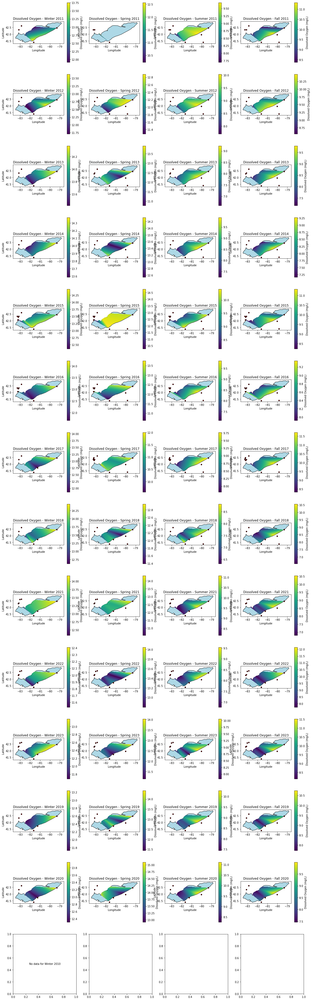

In [29]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
from shapely.geometry import Point

# Load the dissolved oxygen data
df = pd.read_csv('cleaned_dissolved_oxygen.csv')

# Ensure datetime is properly parsed
df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')

# Convert dissolved oxygen to numeric
df['do_mg_L'] = pd.to_numeric(df['do_mg_L'], errors='coerce')

# Add latitude and longitude (already present in your dataset)
# Create a GeoDataFrame
gdf = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(df['longitude'], df['latitude']), crs="EPSG:4326"
)

# Add a season column
def get_season(date):
    month = date.month
    if month in [12, 1, 2]:
        return "Winter"
    elif month in [3, 4, 5]:
        return "Spring"
    elif month in [6, 7, 8]:
        return "Summer"
    elif month in [9, 10, 11]:
        return "Fall"

gdf['season'] = gdf['datetime'].apply(get_season)

# Load Lake Erie GeoJSON
lake_erie = gpd.read_file('lake-erie_812.geojson')
lake_erie = lake_erie.to_crs(epsg=4326)
lake_mask = lake_erie.geometry.unary_union

# Function to plot dissolved oxygen
def plot_dissolved_oxygen_season(data, year, season, ax):
    # Filter data by year and season
    season_data = data[(data['datetime'].dt.year == year) & (data['season'] == season)]
    
    if season_data.empty:
        ax.text(0.5, 0.5, f"No data for {season} {year}", ha='center', va='center', transform=ax.transAxes)
        return None

    # Create a grid for interpolation
    x = np.linspace(season_data['longitude'].min(), season_data['longitude'].max(), 100)
    y = np.linspace(season_data['latitude'].min(), season_data['latitude'].max(), 100)
    xi, yi = np.meshgrid(x, y)
    
    # Interpolate dissolved oxygen
    zi = griddata(
        (season_data['longitude'], season_data['latitude']),
        season_data['do_mg_L'],
        (xi, yi),
        method='linear'
    )

    # Mask areas outside Lake Erie
    mask = np.array([Point(x, y).within(lake_mask) for x, y in zip(xi.flatten(), yi.flatten())])
    mask = mask.reshape(xi.shape)
    zi = np.ma.masked_where(~mask, zi)

    # Plot
    lake_erie.plot(ax=ax, color='lightblue', edgecolor='black')
    im = ax.pcolormesh(xi, yi, zi, cmap='viridis', shading='auto')
    ax.scatter(season_data['longitude'], season_data['latitude'], c='red', s=10, edgecolor='black')
    ax.set_title(f"Dissolved Oxygen - {season} {year}")
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    return im

# Generate plots for each year and season
years = gdf['datetime'].dt.year.unique()
seasons = ['Winter', 'Spring', 'Summer', 'Fall']
fig, axs = plt.subplots(len(years), len(seasons), figsize=(20, 5 * len(years)))

for i, year in enumerate(years):
    for j, season in enumerate(seasons):
        ax_idx = i * len(seasons) + j
        im = plot_dissolved_oxygen_season(gdf, year, season, axs[i, j])
        if im:
            plt.colorbar(im, ax=axs[i, j], label='Dissolved Oxygen (mg/L)')

plt.tight_layout()
plt.show()


In [32]:
def plot_dissolved_oxygen_season(data, year, season, ax):
    # Filter data for the specified year and season
    season_data = data[(data['datetime'].dt.year == year) & (data['season'] == season)]
    if season_data.empty or len(season_data['longitude'].unique()) < 3 or len(season_data['latitude'].unique()) < 3:
        ax.text(0.5, 0.5, f"No data for {season} {year}", ha='center', va='center', transform=ax.transAxes, color='black')
        ax.set_facecolor("white")  # Set panel background to white
        return None

    # Create grid for interpolation
    x = np.linspace(season_data['longitude'].min(), season_data['longitude'].max(), 100)
    y = np.linspace(season_data['latitude'].min(), season_data['latitude'].max(), 100)
    xi, yi = np.meshgrid(x, y)

    try:
        # Interpolate data
        zi = griddata(
            (season_data['longitude'], season_data['latitude']),
            season_data['do_mg_L'],
            (xi, yi),
            method='linear'
        )
    except Exception as e:
        print(f"Interpolation error for {season} {year}: {e}")
        ax.text(0.5, 0.5, f"Interpolation Error\n{season} {year}", ha='center', va='center', transform=ax.transAxes, color='black')
        ax.set_facecolor("white")
        return None

    # Mask areas outside Lake Erie
    mask = np.array([Point(lon, lat).within(lake_mask) for lon, lat in zip(xi.flatten(), yi.flatten())])
    mask = mask.reshape(xi.shape)
    zi = np.ma.masked_where(~mask, zi)

    # Plot
    ax.set_facecolor("white")  # Keep panel background white
    lake_erie.plot(ax=ax, color='black', edgecolor='white')  # Set lake to black
    im = ax.pcolormesh(xi, yi, zi, cmap='viridis', shading='auto')
    ax.scatter(season_data['longitude'], season_data['latitude'], c='red', s=10, edgecolor='black')
    ax.set_title(f"Dissolved Oxygen - {season} {year}", fontsize=8)
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    ax.tick_params(axis='x', colors='black')
    ax.tick_params(axis='y', colors='black')
    return im


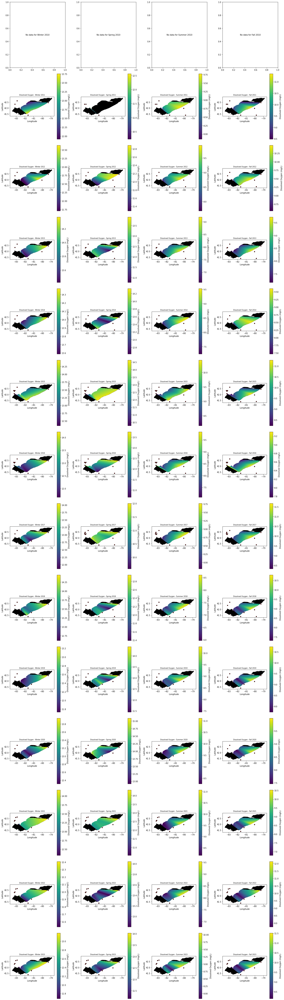

In [5]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
import numpy as np
from scipy.interpolate import griddata
from pykrige.ok import OrdinaryKriging
import matplotlib.pyplot as plt

# Load the dissolved oxygen dataset
df = pd.read_csv('cleaned_dissolved_oxygen.csv')

# Convert `datetime` to datetime type
df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')

# Ensure `do_mg_L` is numeric
df['do_mg_L'] = pd.to_numeric(df['do_mg_L'], errors='coerce')

# Add geometry to create GeoDataFrame
df['geometry'] = df.apply(lambda row: Point(row['longitude'], row['latitude']), axis=1)
gdf = gpd.GeoDataFrame(df, geometry='geometry', crs='EPSG:4326')

# Add a season column based on the datetime
def get_season(date):
    month = date.month
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    elif month in [9, 10, 11]:
        return 'Fall'

gdf['season'] = gdf['datetime'].apply(get_season)

# Load Lake Erie GeoJSON
lake_erie = gpd.read_file('lake-erie_812.geojson')
lake_erie = lake_erie.to_crs(epsg=4326)
lake_mask = lake_erie.geometry.unary_union



In [6]:
import numpy as np

In [7]:
import numpy as np
from pykrige.ok import OrdinaryKriging
import matplotlib.pyplot as plt

# Assuming 'gdf' is your GeoDataFrame with columns 'longitude', 'latitude', and 'do_mg_L'

grid_x = np.linspace(gdf['longitude'].min(), gdf['longitude'].max(), 50)
grid_y = np.linspace(gdf['latitude'].min(), gdf['latitude'].max(), 50)
grid_xi, grid_yi = np.meshgrid(grid_x, grid_y)



In [ ]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
import numpy as np
from pykrige.ok import OrdinaryKriging
import matplotlib.pyplot as plt

# Step 1: Load your data
# Replace 'cleaned_dissolved_oxygen.csv' with the correct path to your dataset
df = pd.read_csv('cleaned_dissolved_oxygen.csv')

# Step 2: Ensure datetime and numeric conversions
df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')
df['do_mg_L'] = pd.to_numeric(df['do_mg_L'], errors='coerce')

# Step 3: Create a GeoDataFrame
geometry = [Point(xy) for xy in zip(df['longitude'], df['latitude'])]
gdf = gpd.GeoDataFrame(df, geometry=geometry, crs="EPSG:4326")

# Step 4: Grid for interpolation
grid_x = np.linspace(gdf['longitude'].min(), gdf['longitude'].max(), 50)
grid_y = np.linspace(gdf['latitude'].min(), gdf['latitude'].max(), 50)
grid_xi, grid_yi = np.meshgrid(grid_x, grid_y)

# Step 5: Apply Kriging interpolation
kriging = OrdinaryKriging(
    gdf['longitude'].values,
    gdf['latitude'].values,
    gdf['do_mg_L'].values,
    variogram_model="linear",
    verbose=False,
    enable_plotting=False,
)
zi, ss = kriging.execute("grid", grid_x, grid_y)

# Step 6: Plot results
plt.figure(figsize=(10, 8))
plt.pcolormesh(grid_xi, grid_yi, zi, cmap='viridis', shading='auto')
plt.scatter(gdf['longitude'], gdf['latitude'], c=gdf['do_mg_L'], edgecolor='black', cmap='viridis')
plt.colorbar(label='Dissolved Oxygen (mg/L)')
plt.title('Kriged Dissolved Oxygen Levels')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()



Water Temperature

In [ ]:
import os
import requests
from datetime import datetime, timedelta

# Base URL for NCSS requests
base_url = "https://apps.glerl.noaa.gov/thredds/ncss/grid/glsea_nc/{year}/{month}/{filename}?var=sst&north=42.5&west=-83.6&east=-78.9&south=41.3&horizStride=1&time_start={date}T12:00:00Z&time_end={date}T12:00:00Z&&&accept=netcdf4-classic"

# Output directory to save downloaded files
output_dir = "Lake_Erie_Daily_Data"
os.makedirs(output_dir, exist_ok=True)

# Loop through years, months, and days
start_date = datetime(2009, 1, 1)
end_date = datetime(2023, 12, 31)
current_date = start_date

while current_date <= end_date:
    year = current_date.year
    month = f"{current_date.month:02d}"
    day_of_year = (current_date - datetime(current_date.year, 1, 1)).days + 1
    filename = f"{year}_{day_of_year:03d}_glsea_sst.nc"
    
    # Construct the full URL
    request_url = base_url.format(
        year=year,
        month=month,
        filename=filename,
        date=current_date.strftime("%Y-%m-%d")
    )
    
    # Local file path
    local_file = os.path.join(output_dir, f"{year}_{current_date.strftime('%m%d')}.nc")
    
    # Check if the file already exists
    if os.path.exists(local_file):
        print(f"File already exists: {local_file}")
    else:
        print(f"Downloading {local_file} from {request_url}")
        try:
            response = requests.get(request_url)
            response.raise_for_status()  # Check for request errors
            with open(local_file, 'wb') as f:
                f.write(response.content)
            print(f"Saved: {local_file}")
        except requests.exceptions.RequestException as e:
            print(f"Failed to download {local_file}: {e}")
    
    # Move to the next day
    current_date += timedelta(days=1)


Saved: Lake_Erie_Daily_Data/2009_0101.nc
Saved: Lake_Erie_Daily_Data/2009_0102.nc
Saved: Lake_Erie_Daily_Data/2009_0103.nc
Saved: Lake_Erie_Daily_Data/2009_0104.nc
Saved: Lake_Erie_Daily_Data/2009_0105.nc
Saved: Lake_Erie_Daily_Data/2009_0106.nc
Saved: Lake_Erie_Daily_Data/2009_0107.nc
Saved: Lake_Erie_Daily_Data/2009_0108.nc
Saved: Lake_Erie_Daily_Data/2009_0109.nc
Saved: Lake_Erie_Daily_Data/2009_0110.nc
Saved: Lake_Erie_Daily_Data/2009_0111.nc
Saved: Lake_Erie_Daily_Data/2009_0112.nc
Saved: Lake_Erie_Daily_Data/2009_0113.nc
Saved: Lake_Erie_Daily_Data/2009_0114.nc
Saved: Lake_Erie_Daily_Data/2009_0115.nc
Saved: Lake_Erie_Daily_Data/2009_0116.nc
Saved: Lake_Erie_Daily_Data/2009_0117.nc
Saved: Lake_Erie_Daily_Data/2009_0118.nc
Saved: Lake_Erie_Daily_Data/2009_0119.nc
Saved: Lake_Erie_Daily_Data/2009_0120.nc
Saved: Lake_Erie_Daily_Data/2009_0121.nc
Saved: Lake_Erie_Daily_Data/2009_0122.nc
Saved: Lake_Erie_Daily_Data/2009_0123.nc
Saved: Lake_Erie_Daily_Data/2009_0124.nc
Saved: Lake_Erie

In [4]:
pip install --upgrade xarray netCDF4 cftime

     |████████████████████████████████| 849kB 9.6MB/s 
     |████████████████████████████████| 768kB 78.1MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 61kB 36.2MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Using cached https://files.pythonhosted.org/packages/ff/94/64287b38c7de4c90683630338cf28f129decbba0a44f0c6db35a873c73c4/importlib_metadata-6.7.0-py3-none-any.whl
  Using cached https://files.pythonhosted.org/packages/5b/fa/c9e82bbe1af6266adf08afb563905eb87cab83fde00a0a08963510621047/zipp-3.15.0-py3-none-any.whl
  Created wheel for netCDF4: filename=netCDF4-1.6.5-cp37-cp37m-linux_x86_64.whl size=1987751 sha256=3aa80facd8099cde74fa37fdbd543e49c1e4089076bffcb9c21c098890c1b292
  Stored in directory: /home/jovyan/.cache/pip/wheels/ae/5a

In [6]:
pip install --upgrade xarray cftime netCDF4


Requirement already up-to-date: xarray in /opt/conda/lib/python3.7/site-packages (0.20.2)
Requirement already up-to-date: cftime in /opt/conda/lib/python3.7/site-packages (1.6.2)
Requirement already up-to-date: netCDF4 in /opt/conda/lib/python3.7/site-packages (1.6.5)
Note: you may need to restart the kernel to use updated packages.


In [5]:
combined_data = xr.open_mfdataset(
    files,
    combine="by_coords",
    decode_times=False  # Prevent CFTimeIndex issues
)


NameError: name 'xr' is not defined

In [8]:
file = files[0]  # Check the first file
single_dataset = xr.open_dataset(file, decode_times=False)
print(single_dataset)


<xarray.Dataset>
Dimensions:  (lat: 87, lon: 337, time: 1)
Coordinates:
  * lon      (lon) float64 -83.6 -83.59 -83.58 -83.56 ... -78.92 -78.91 -78.89
  * time     (time) int32 1333886400
  * lat      (lat) float64 41.3 41.31 41.33 41.34 ... 42.46 42.48 42.49 42.51
Data variables:
    sst      (time, lat, lon) float32 ...
    crs      int32 ...
Attributes:
    Conventions:         CF-1.5
    GDAL:                GDAL 3.4.3, released 2022/04/22
    history:             Wed Jun 12 03:23:29 2024: ncrename -v Band1,sst /hom...
    NCO:                 netCDF Operators version 5.0.7 (Homepage = http://nc...
    title:               SST from Great Lakes Surface Environmental Analysis ...
    source:              2012_099_glsea.asc
    History:             Translated to CF-1.0 Conventions by Netcdf-Java CDM ...
    geospatial_lat_min:  41.29266393368361
    geospatial_lat_max:  42.51201394115602
    geospatial_lon_min:  -83.6111980940419
    geospatial_lon_max:  -78.88796875475228


In [9]:
combined_data = xr.open_mfdataset(
    files,
    combine="nested",
    concat_dim="time",  # Adjust dimension name as needed
    decode_times=False
)


In [ ]:
combined_data.to_netcdf("Lake_Erie_Combined_2009_2023.nc")

In [7]:
import os
print(os.path.isfile("Lake_Erie_Combined_2009_2023.nc"))


True


In [7]:
from netCDF4 import Dataset

nc = Dataset("Lake_Erie_Combined_2009_2023.nc", mode="r")
print(nc)


<class 'netCDF4._netCDF4.Dataset'>
root group (NETCDF4 data model, file format HDF5):
    Conventions: CF-1.5
    GDAL: GDAL 3.4.3, released 2022/04/22
    history: Wed Jun 12 03:23:29 2024: ncrename -v Band1,sst /home/cw/opr/glsea2/mk_nc/output/2012_099_glsea_sst.nc
Wed Jun 12 03:23:29 2024: GDAL Create( /home/cw/opr/glsea2/mk_nc/output/2012_099_glsea_sst.nc, ... )
    NCO: netCDF Operators version 5.0.7 (Homepage = http://nco.sf.net, Code = http://github.com/nco/nco)
    title: SST from Great Lakes Surface Environmental Analysis (GLSEA)
    source: 2012_099_glsea.asc
    History: Translated to CF-1.0 Conventions by Netcdf-Java CDM (CFGridCoverageWriter)
Original Dataset = 2012_099_glsea_sst.nc; Translation Date = 2024-11-21T00:12:29.848Z
    geospatial_lat_min: 41.29266393368361
    geospatial_lat_max: 42.51201394115602
    geospatial_lon_min: -83.6111980940419
    geospatial_lon_max: -78.88796875475228
    dimensions(sizes): lon(337), lat(87), time(5478)
    variables(dimensions): f

In [8]:
print(nc.variables.keys())  # List all variables
print(nc.variables['time'])  # Inspect the time variable
print(nc.variables['sst'])   # Inspect the SST variable


dict_keys(['lon', 'lat', 'time', 'sst', 'crs'])
<class 'netCDF4._netCDF4.Variable'>
int64 time(time)
    axis: T
    calendar: Gregorian
    long_name: Time
    standard_name: time
    units: seconds since 1970-01-01T00:00:00Z
unlimited dimensions: 
current shape = (5478,)
filling on, default _FillValue of -9223372036854775806 used
<class 'netCDF4._netCDF4.Variable'>
float32 sst(time, lat, lon)
    _FillValue: -99999.0
    long_name: Temperature
    grid_mapping: crs
    units: Celsius
    standard_name: sea_water_temperature
unlimited dimensions: 
current shape = (5478, 87, 337)
filling on


In [9]:
from netCDF4 import num2date

time_var = nc.variables['time']
time_units = time_var.units  # "seconds since 1970-01-01T00:00:00Z"
time_calendar = time_var.calendar  # "Gregorian"

times = num2date(time_var[:], units=time_units, calendar=time_calendar)
print(times[:10])  # Display the first 10 timestamps


[cftime.DatetimeGregorian(2012, 4, 8, 12, 0, 0, 0, has_year_zero=False)
 cftime.DatetimeGregorian(2010, 7, 19, 12, 0, 0, 0, has_year_zero=False)
 cftime.DatetimeGregorian(2012, 6, 5, 12, 0, 0, 0, has_year_zero=False)
 cftime.DatetimeGregorian(2013, 1, 22, 12, 0, 0, 0, has_year_zero=False)
 cftime.DatetimeGregorian(2016, 2, 24, 12, 0, 0, 0, has_year_zero=False)
 cftime.DatetimeGregorian(2022, 5, 12, 12, 0, 0, 0, has_year_zero=False)
 cftime.DatetimeGregorian(2016, 5, 8, 12, 0, 0, 0, has_year_zero=False)
 cftime.DatetimeGregorian(2020, 4, 10, 12, 0, 0, 0, has_year_zero=False)
 cftime.DatetimeGregorian(2018, 9, 27, 12, 0, 0, 0, has_year_zero=False)
 cftime.DatetimeGregorian(2020, 11, 1, 12, 0, 0, 0, has_year_zero=False)]


In [ ]:
import numpy as np

sst_data = nc.variables['sst'][:]
sst_data = np.where(sst_data == -99999.0, np.nan, sst_data)


In [2]:
from netCDF4 import Dataset

# Open the NetCDF file
file_path = "Lake_Erie_Combined_2009_2023.nc"  # Update with your actual file path
nc = Dataset(file_path, 'r')


In [3]:
# Extract longitude and latitude
lons = nc.variables['lon'][:]
lats = nc.variables['lat'][:]

# Create masks for Lake Erie
lon_mask = (lons >= -83.6) & (lons <= -78.9)
lat_mask = (lats >= 41.3) & (lats <= 42.5)

print(f"Longitude mask: {lon_mask}")
print(f"Latitude mask: {lat_mask}")


Longitude mask: [False  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  Tru

In [ ]:
sst_data = nc.variables['sst'][:]  # SST variable
sst_erie = sst_data[:, lat_mask, :][:, :, lon_mask]

print(sst_erie.shape)  # Verify the subsetted dimensions
